# <font size="9"> <span style="color:rgb(112, 173, 71)"> Data Methods for Health Research Assignment </font>

# <font size="5"> <span style="color:rgb(72, 72, 72)"> Loading of standard modules </font>

In [1]:
import pandas as pd
import numpy as np

%matplotlib inline
import random
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.ticker as mtick

from math import floor
from pandasql import PandaSQL

import numpy.polynomial.polynomial as poly

# <font size="6"> <span style="color:rgb(72, 72, 72)"> Read in Data </font>
<font size="5"> <span style="color:rgb(72, 72, 72)"> Practice Address Data </font>

In [2]:
############################################
# Read in the GP address data as a CSV file 
# HSCIC GP Practice Prescribing (Dec/2015)
############################################

# Store the url of the data as a variable
url_GP_address= 'https://s3.eu-west-2.amazonaws.com/dmhr-data/practices_Dec2015.csv'

#Introduce column headings as original data has none
col_heads_GP_address = ['PERIOD', 'PRACTICE', 'PRACTICE NAME', 'ADDRESS_1', 
                        'ADDRESS_2', 'ADDRESS_3', 'ADDRESS_4', 'POSTCODE']

#Set up a DataFrame using a subset of the original data.
df_GP_address_ORIG = pd.read_csv(url_GP_address, names=col_heads_GP_address, index_col=False, 
                            usecols=['PRACTICE', 'PRACTICE NAME','POSTCODE'])

#Remove trailing spaces from data.
df_GP_address_ORIG = df_GP_address_ORIG.applymap(lambda x: str(x).strip())

df_GP_address_ORIG.head(1)

,PRACTICE,PRACTICE NAME,POSTCODE
0,A81001,THE DENSHAM SURGERY,TS18 1HU


# <font size="6"> <span style="color:rgb(72, 72, 72)"> Read in Data </font>
<font size="5"> <span style="color:rgb(72, 72, 72)"> Medications Prescribed with price & spend Data </font>

In [3]:
###############################################
# Read in the GP prescribing data as a CSV file
# HSCIC GP Practice Prescribing (Dec/2015)
###############################################

# Store the url of the data as a variable
url_GP_prescribing= 'https://s3.eu-west-2.amazonaws.com/dmhr-data/prescribing_Dec2015.csv'

# Create column headings for DataFrame
col_heads_GP_prescribing = ['SHA', 'PCT', 'PRACTICE', 'BNF CODE', 'BNF NAME', 'ITEMS', 
                            'NIC (£)', 'ACT COST (£)', 'QUANTITY', 'PERIOD','BLANK']

#Set up a DataFrame
df_GP_prescribing_ORIG = pd.read_csv(url_GP_prescribing,header=0,
                                          names=col_heads_GP_prescribing, index_col=False)

df_GP_prescribing_ORIG.head(1)

# Note: Before clean, GP data column headings had too many spaces and one empty column

,SHA,PCT,PRACTICE,BNF CODE,BNF NAME,ITEMS,NIC (£),ACT COST (£),QUANTITY,PERIOD,BLANK
0,Q44,RJN,Y05218,0501013K0AAAJAJ,Co-Amoxiclav_Tab 500mg/125mg,1,3.59,3.33,21,201512,


# <font size="6"> <span style="color:rgb(72, 72, 72)"> Read in Data </font>
<font size="5"> <span style="color:rgb(72, 72, 72)"> Number of Patients Data </font>

In [4]:
###############################################################################
# Read in the number of registered patients in GP practices as a CSV data file 
# HSCIC GP demographic information
###############################################################################

# Store the url of the data as a variable
url_GP_patient_nbrs = 'https://digital.nhs.uk/media/28273/Numbers-of-Patients-Registered-at-a-GP-Practice-Jan-2016-GP-Practice-and-quinary-age-groups/Any/gp-reg-patients-prac-quin-age'


#Set up a DataFrame using a subset of the original data.
df_GP_patient_nbrs_ORIG = pd.read_csv(url_GP_patient_nbrs, index_col=False, 
                                 usecols=['GP_PRACTICE_CODE', 'Total_All'])

#Rename column headings
df_GP_patient_nbrs_ORIG.rename(columns={'GP_PRACTICE_CODE':'PRACTICE','Total_All':'TOTAL NUMBER OF PATIENTS'}, inplace=True)


#Remove trailing spaces from data.
df_GP_patient_nbrs_ORIG['PRACTICE'] = df_GP_patient_nbrs_ORIG['PRACTICE'].str.strip()

df_GP_patient_nbrs_ORIG.head(1)

,PRACTICE,TOTAL NUMBER OF PATIENTS
0,A81001,4234


# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment A </font>

# <font size="5"><span style="color:rgb(72, 72, 72)">A (0) Prelimaries</font>

In [5]:
#Bolton postcodes
postcodes_list_bolton=['BL1','BL2','BL3','BL4','BL5','BL6','BL7']

#DataFrame for Bolton Postcodes
df_postcodes_bolton = pd.DataFrame(np.array(postcodes_list_bolton).reshape(7,1), 
                                   columns = ['BOLTON POSTECODES'])

#Cambridge postcodes
postcodes_list_cambridge=['CB1','CB2','CB3','CB4','CB5','CB21','CB22','CB23','CB24','CB25']

#DataFrame for Cambridge Postcodes
df_postcodes_cambridge = pd.DataFrame(np.array(postcodes_list_cambridge).reshape(10,1), 
                                      columns = ['CAMBRIDGE POSTECODES'])

In [6]:
# Combine 'df_GP_prescribing_ORIG' with 'df_GP_address_ORIG'

df_GP_prescribing_merge_with_address = pd.merge(df_GP_prescribing_ORIG, df_GP_address_ORIG, how='left',
                                          left_on='PRACTICE', right_on='PRACTICE')

# Extract from "df_GP_prescribing_merge_with_address" the first 4 characters from 'POSTCODE',
# rename column heading as 'SHORT POSTCODE' & remove blanks

df_postcode_extract= pd.DataFrame(df_GP_prescribing_merge_with_address['POSTCODE'].astype(str).str[:4]).rename(columns = {'POSTCODE':'SHORT POSTCODE'})
df_postcode_short=df_postcode_extract['SHORT POSTCODE'].str.replace(' ', '')


df_GP_practice_prescribing = pd.concat([df_GP_prescribing_merge_with_address, df_postcode_short], axis=1)

#df_GP_practice_prescribing.head(1)

In [7]:
#######################################
# Create Bolton & Cambridge DataFrames
######################################

# Bolton prescribing data only 
# dropping columns 'BOLTON POSTECODES' &'SHORT POSTCODE' using code: df.drop(['B', 'C'], axis=1)

df_GP_practice_prescribing_bolton = pd.merge(df_postcodes_bolton, df_GP_practice_prescribing, how='left',
                                             left_on='BOLTON POSTECODES', right_on='SHORT POSTCODE').drop(['BOLTON POSTECODES', 'SHORT POSTCODE'], axis=1)

# Cambridge prescribing data only 
# dropping columns 'CAMBRIDGE POSTECODES' &'SHORT POSTCODE' using code: df.drop(['B', 'C'], axis=1)

df_GP_practice_prescribing_cambridge = pd.merge(df_postcodes_cambridge, df_GP_practice_prescribing, how='left',
                                             left_on='CAMBRIDGE POSTECODES', right_on='SHORT POSTCODE').drop(['CAMBRIDGE POSTECODES', 'SHORT POSTCODE'], axis=1)
#df_GP_practice_prescribing_bolton.head(1)

# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment A </font>
   
# <font size="5"><span style="color:rgb(72, 72, 72)">A (1) i. Identification of all GP practices</font>
  
# <font size="5"><span style="color:rgb(72, 72, 72)">A (1) ii. Production of a table with the "total number of prescriptions" and their "total actual cost" </font>


In [8]:
#This is for the total number of prescriptions Summing over "ITEMS" column
# & the total cost of prescriptions Summing over "ACT COST" column

df_Rx_nbr_spend=pd.DataFrame(df_GP_practice_prescribing_bolton.groupby('PRACTICE')['ITEMS','ACT COST (£)'].sum())

df_Rx_nbr_spend.columns=['TOTAL NUMBER OF PRESCRIPTIONS','TOTAL COST OF PRESCRIPTIONS (£)'] # Name the column

df_Rx_nbr_spend.reset_index(inplace=True) # Reseting the index


#A DataFrame with only "PRACTICE" & "PRACTICE NAME" from 'df_GP_practice_prescribing_bolton'

df_practice_name_code=df_GP_practice_prescribing_bolton.loc[:,'PRACTICE':'PRACTICE NAME':8]

#Merge the two dataframes 'df_practice_name_code' and 'df_Rx_nbr_spend'

df_QA_1_merge=pd.merge(df_practice_name_code,df_Rx_nbr_spend).drop_duplicates(subset=None, keep='first', inplace=False)


df_QA_1_sorted=df_QA_1_merge.sort_values(['PRACTICE'], ascending=[True]) #Sort by PRACTICE code
df_QA_1=df_QA_1_sorted.reset_index(drop=True) # Reseting the index


#######################
# Results table styled
#######################

df_QA_1_styled=df_QA_1.style.format({
    'TOTAL NUMBER OF PRESCRIPTIONS': '{:,.0f}'.format,
    'TOTAL COST OF PRESCRIPTIONS (£)': '{:,.0f}'.format})

df_QA_1_styled

,PRACTICE,BLANK,TOTAL NUMBER OF PRESCRIPTIONS,TOTAL COST OF PRESCRIPTIONS (£)
0,P82001,,"18,419","164,398"
1,P82002,,"12,734","108,972"
2,P82003,,"22,613","208,776"
3,P82004,,"15,775","120,830"
4,P82005,,"9,674","92,823"
5,P82006,,"13,373","114,165"
6,P82007,,"24,377","203,194"
7,P82008,,"29,330","217,671"
8,P82009,,"14,147","102,178"
9,P82010,,"12,816","94,423"


# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment A </font>
  
# <font size="5"><span style="color:rgb(72, 72, 72)">A (2) i. The top ten most frequently prescribed medications across all Bolton practices and their total actual costs</font>

# <font size="5"><span style="color:rgb(72, 72, 72)">A (2) ii. The top ten least frequently prescribed medications across all Bolton practices and their total actual costs</font>

In [9]:
##################################################################################
# Create a truncated version of the DataFrame "df_GP_practice_prescribing_bolton"
# in which columns with numerical values are summed
# giving totals for "ITEMS" "NIC" "ACT COST" "QUANTITY" for each medication
##################################################################################

#Extract drugs and corresponding numerical values

temp_Rx=df_GP_practice_prescribing_bolton.loc[:,'BNF NAME':'QUANTITY':]

#sum numerical values, give column headings, insert index values

temp_Rx_summary=pd.DataFrame(temp_Rx.groupby('BNF NAME').sum())
temp_Rx_summary.columns=['TOTAL ITEMS DISPENSED','TOTAL NET INGREDIENT COST (£)','TOTAL ACTUAL COST (£)','TOTAL QUANTITY DISPENSED']
temp_Rx_summary.reset_index(inplace=True)


######################################################################################################
# A DataFrame with only "BNF CODE" & "BNF NAME" from the DataFrame "df_GP_practice_prescribing_bolton"
######################################################################################################

temp_Rx_code=df_GP_practice_prescribing_bolton.loc[:,'BNF CODE':'BNF NAME':]

#####################################################################
# combine "temp_Rx_code" and "temp_Rx_summary" and remove duplicates
#####################################################################

combine_temp_Rx_code_temp_med_summary=pd.merge(temp_Rx_code,temp_Rx_summary).drop_duplicates(subset=None, keep='first', inplace=False)

#reindex 

Rx_totals_bolton_full=combine_temp_Rx_code_temp_med_summary.reset_index(drop=True)

#drop columns not asked for 
temp_Rx = Rx_totals_bolton_full.loc[:, ['BNF CODE','BNF NAME','TOTAL ITEMS DISPENSED','TOTAL ACTUAL COST (£)']]

In [10]:
##############################################################################
# Getting top ten most frequently prescribed medications across all practices
# and the total actual cost
##############################################################################

#Identify top 10 most dispensed

top_Rx_bolton_all=temp_Rx.sort_values(['TOTAL ITEMS DISPENSED'], ascending=False)

top_10_Rx_bolton=top_Rx_bolton_all.head(10)

top_10_Rx_bolton.index=['Most prescribed', '2nd most prescribed','3rd', 
                        '4th','5th','6th','7th','8th', '9th','10th']

#######################
# Results table styled
#######################

top_10_Rx_bolton_styled=top_10_Rx_bolton.style.format({
    'TOTAL ITEMS DISPENSED': '{:,.0f}'.format,
    'TOTAL ACTUAL COST (£)': '{:,.0f}'.format})

top_10_Rx_bolton_styled

,BNF CODE,BNF NAME,TOTAL ITEMS DISPENSED,TOTAL ACTUAL COST (£)
Most prescribed,0103050P0AAAAAA,Omeprazole_Cap E/C 20mg,"16,667","25,256"
2nd most prescribed,0212000Y0AAADAD,Simvastatin_Tab 40mg,"11,114","14,438"
3rd,0407010H0AAAMAM,Paracet_Tab 500mg,"9,999","32,997"
4th,0209000A0AAABAB,Aspirin Disper_Tab 75mg,"9,380","8,505"
5th,0301011R0AAAPAP,Salbutamol_Inha 100mcg (200 D) CFF,"7,154","12,298"
6th,0206020A0AAAAAA,Amlodipine_Tab 5mg,"6,718","7,549"
7th,0601022B0AAABAB,Metformin HCl_Tab 500mg,"5,824","25,465"
8th,0202010B0AAABAB,Bendroflumethiazide_Tab 2.5mg,"5,789","6,529"
9th,0103050L0AAAAAA,Lansoprazole_Cap 30mg (E/C Gran),"5,677","10,022"
10th,0205051R0AAADAD,Ramipril_Cap 10mg,"5,551","9,133"


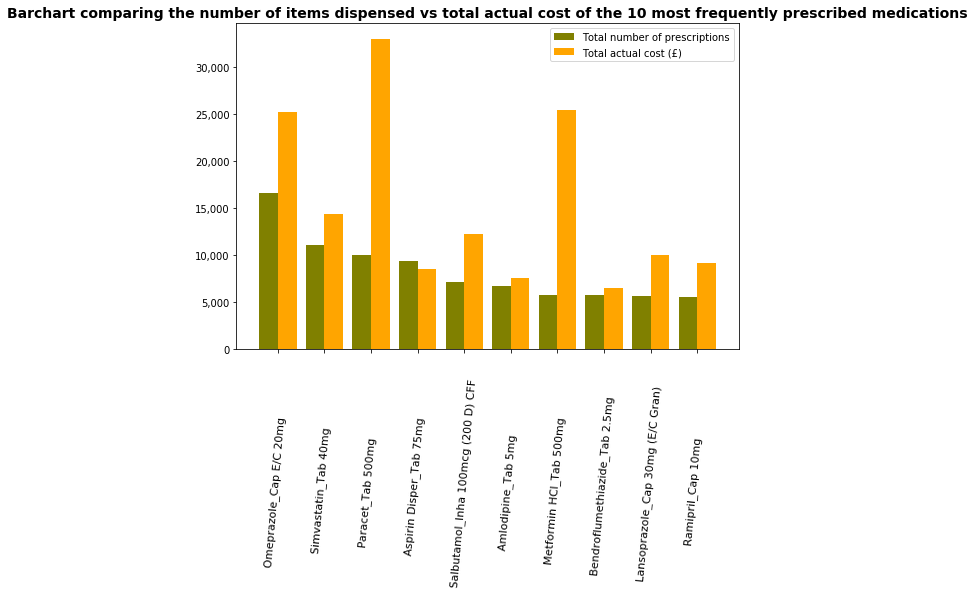

In [11]:
##########################################################################
# Barchart comparing TOTAL ITEMS DISPENSED with TOTAL ACTUAL COST (£) for 
# top 10 most frequently prescribed medications
##########################################################################

#Create tuples from the dataframe "top_10_Rx_bolton" for barchart

df_for_tuples_a2i=top_10_Rx_bolton.reset_index(drop=True)

med_name_a2i=tuple(df_for_tuples_a2i['BNF NAME'].tolist())
med_nbr_item_a2i=tuple(df_for_tuples_a2i['TOTAL ITEMS DISPENSED'].tolist())
med_actual_cost_a2i=tuple(df_for_tuples_a2i['TOTAL ACTUAL COST (£)'].tolist())

ind = np.arange(len(med_nbr_item_a2i))  # x locations for the groups
width = 0.4  # width of the bars

fig, ax = plt.subplots(figsize=(9, 6))

rects1 = ax.bar(ind - width/2,med_nbr_item_a2i, width,color='olive', label='Total number of prescriptions')
rects2 = ax.bar(ind + width/2, med_actual_cost_a2i, width, color='orange', label='Total actual cost (£)')

plt.xticks(rotation=85)
ax.set_title('Barchart comparing the number of items dispensed vs total actual cost of the 10 most frequently prescribed medications', fontsize=14, fontweight='bold')
ax.set_xticks(ind)
ax.set_xticklabels(med_name_a2i, fontsize=11)
ax.legend()

##########################
# Format X & Y tick values
##########################

fmt = '{x:,.0f}'

tick = mtick.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick) 

plt.show()

In [12]:
###########################################################################
# Getting ten least frequently prescribed medications across all practices
# and the total actual cost
###########################################################################

bottom_Rx_bolton=temp_Rx.sort_values(['TOTAL ITEMS DISPENSED', 'TOTAL ACTUAL COST (£)'], 
                                        ascending=[True, True])

bottom_10_Rx_bolton=bottom_Rx_bolton.head(10)

bottom_10_Rx_bolton.index=['Least prescribed','2nd least prescribed', '3rd', 
                           '4th','5th', '6th','7th','8th', '9th','10th']

#######################
# Results table styled
#######################

bottom_10_Rx_bolton_styled=bottom_10_Rx_bolton.style.format({
    'TOTAL ITEMS DISPENSED': '{:,.0f}'.format,
    'TOTAL ACTUAL COST (£)': '{:,.2f}'.format})

bottom_10_Rx_bolton_styled
#Note Also sorted on 'TOTAL ACTUAL COST (£)' as there were >1500 meds where only 1 item was prescribed

,BNF CODE,BNF NAME,TOTAL ITEMS DISPENSED,TOTAL ACTUAL COST (£)
Least prescribed,0407010Q0AAAAAA,Co-Proxamol_Tab 32.5mg/325mg,1,0.18
2nd least prescribed,20100000551,Unspecified Surg Adh Tape 1.25cm x 5m Pe,1,0.26
3rd,091000000BBPPA0,Valupak_Multivit & Mineral Tab OAD,1,0.32
4th,20090000936,CliniFast 5cm x 1m (Green) Stkntte Elasc,1,0.55
5th,20090000451,Unspecified Stkntte 6.25cm x 0.5m Elasct,1,0.55
6th,0906011H0AAAGAG,Cod Liver Oil_Cap 1g,1,0.57
7th,0106020M0AAAEAE,Senna_Oral Soln 7.5mg/5ml,1,0.61
8th,20040200300,Ribbon Gz 1.25cm x 5m Ster Absorbent Cot,1,0.80
9th,20090000805,Coverflex 5cm x 1m (Green) Stkntte Elasc,1,0.80
10th,0212000Y0BDABAB,Simvador_Tab 20mg,1,0.81


In [13]:
#Sum the total amount spent on the top 10 prescribed meducations in Bolton

df_Rx_most_least = pd.DataFrame([top_10_Rx_bolton['TOTAL ACTUAL COST (£)'].sum(),
                  bottom_10_Rx_bolton['TOTAL ACTUAL COST (£)'].sum()], 
                  columns=['Total Amount Spent across all Bolton (£)'], 
                  index=['10 most frequently prescribed medications',
                         '10 least frequently prescribed medications'])

#######################
# Results table styled
#######################

df_Rx_most_least_styled=df_Rx_most_least.style.format({'Total Amount Spent across all Bolton (£)': '{:,.0f}'.format})

df_Rx_most_least_styled

,Total Amount Spent across all Bolton (£)
10 most frequently prescribed medications,"152,192"
10 least frequently prescribed medications,5


# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment A </font>
  
# <font size="5"><span style="color:rgb(72, 72, 72)">A (2) iii. Comparing the most/least frequently prescribed medications in Bolton practices to the overall actual costs of each practice and to the overall actual costs of the entire city</font>

In [14]:
#######################################################################################
# Comparing actual costs on most frequently prescribed medications across all practices
# with the overall actual costs of each practice
#######################################################################################

transpose_top_bolton=pd.DataFrame(top_10_Rx_bolton.transpose())

transpose_top_bolton_Shrt= transpose_top_bolton.drop(['BNF CODE','BNF NAME','TOTAL ITEMS DISPENSED'])

############################################
#Expand so that as big as QA_1
############################################

no_rows_QA_1=len(df_QA_1.index)

temp_long1=pd.concat([transpose_top_bolton_Shrt]*no_rows_QA_1)

temp_long=temp_long1.reset_index()


shrt_QA_1=df_QA_1.filter(['PRACTICE','TOTAL COST OF PRESCRIPTIONS (£)'], axis=1) #This drops columns


##########################################
# need to combine shrt_QA_1  temp_long
##########################################

result_temp=shrt_QA_1.join(temp_long)

compare_most=result_temp.drop(['index'], axis=1)

#####################
#finding proportions
#####################
print("""

The table below shows the amounts spent on each of the 10 most frequently prescribed medications 
in Bolton as a percentage of the overall monthly spend by each of the GP practices in Bolton.

""")

compare_most.loc[:,"Most prescribed":"10th"] = compare_most.loc[:,"Most prescribed":"10th"].div(compare_most["TOTAL COST OF PRESCRIPTIONS (£)"], axis=0)
compare_most = compare_most.rename(columns={'TOTAL COST OF PRESCRIPTIONS (£)': 'Total Monthly Spend on all Prescriptions (£)'})
#compare_most.head()

#######################
# Results table styled
#######################

compare_most_styled=compare_most.style.format({'Total Monthly Spend on all Prescriptions (£)': '{:,.0f}'.format,
'Most prescribed': '{:,.1%}'.format,'2nd most prescribed': '{:,.1%}'.format,
'3rd': '{:,.1%}'.format,'4th': '{:,.1%}'.format,'5th': '{:,.1%}'.format,'6th': '{:,.1%}'.format,
'7th': '{:,.1%}'.format,'8th': '{:,.1%}'.format,'9th': '{:,.1%}'.format,'10th': '{:,.1%}'.format})

compare_most_styled



The table below shows the amounts spent on each of the 10 most frequently prescribed medications 
in Bolton as a percentage of the overall monthly spend by each of the GP practices in Bolton.




,PRACTICE,Total Monthly Spend on all Prescriptions (£),Most prescribed,2nd most prescribed,3rd,4th,5th,6th,7th,8th,9th,10th
0,P82001,"164,398",15.4%,8.8%,20.1%,5.2%,7.5%,4.6%,15.5%,4.0%,6.1%,5.6%
1,P82002,"108,972",23.2%,13.2%,30.3%,7.8%,11.3%,6.9%,23.4%,6.0%,9.2%,8.4%
2,P82003,"208,776",12.1%,6.9%,15.8%,4.1%,5.9%,3.6%,12.2%,3.1%,4.8%,4.4%
3,P82004,"120,830",20.9%,11.9%,27.3%,7.0%,10.2%,6.2%,21.1%,5.4%,8.3%,7.6%
4,P82005,"92,823",27.2%,15.6%,35.5%,9.2%,13.2%,8.1%,27.4%,7.0%,10.8%,9.8%
5,P82006,"114,165",22.1%,12.6%,28.9%,7.4%,10.8%,6.6%,22.3%,5.7%,8.8%,8.0%
6,P82007,"203,194",12.4%,7.1%,16.2%,4.2%,6.1%,3.7%,12.5%,3.2%,4.9%,4.5%
7,P82008,"217,671",11.6%,6.6%,15.2%,3.9%,5.6%,3.5%,11.7%,3.0%,4.6%,4.2%
8,P82009,"102,178",24.7%,14.1%,32.3%,8.3%,12.0%,7.4%,24.9%,6.4%,9.8%,8.9%
9,P82010,"94,423",26.7%,15.3%,34.9%,9.0%,13.0%,8.0%,27.0%,6.9%,10.6%,9.7%


In [15]:
## # Comparing actual costs on most frequently prescribed medications across all practices
# with the overall actual costs of the city of Bolton as a whole
#######################################################################################

# Total Spend on all Prescriptions for the Month
df_bolton_sum_total = pd.DataFrame([{'All medications prescribed in Bolton':df_QA_1['TOTAL COST OF PRESCRIPTIONS (£)'].sum()}])

#total spend on top 10 prescriptions
df_Rx_most=df_Rx_most_least[0:1].reset_index(drop=True).rename(columns={'Total Amount Spent across all Bolton (£)': 'Top 10 most frequently prescribed medications'}) 

#Use temp column fix to merge two tables with no common columns
df_bolton_sum_total ['tmp'] = 1
df_Rx_most['tmp'] = 1

df_Rx_bolton_and_most= pd.merge(df_bolton_sum_total, df_Rx_most, on=['tmp'])

df_Rx_bolton_and_most=df_Rx_bolton_and_most.drop('tmp', axis=1) # drop the temp column

#Use temp column fix to merge two tables with no common columns
df_Rx_bolton_and_most['tmp'] = 1
transpose_top_bolton_Shrt['tmp'] = 1

Compare_city_with_top_Rx_temp = pd.merge(df_Rx_bolton_and_most, transpose_top_bolton_Shrt, on=['tmp'])


Compare_city_with_top_Rx_temp=Compare_city_with_top_Rx_temp.drop('tmp', axis=1) # drop the temp column

Compare_city_with_top_Rx_temp2=pd.concat([Compare_city_with_top_Rx_temp]*2)

Compare_city_with_top_Rx_temp3=Compare_city_with_top_Rx_temp2.reset_index()

############################################################
#Below divides the new row by total bolton giving proportions
#############################################################

Compare_city_with_top_Rx_temp3.loc[1] = Compare_city_with_top_Rx_temp3.loc[1] / df_QA_1['TOTAL COST OF PRESCRIPTIONS (£)'].sum()

#Below renames indices

Compare_city_with_top_Rx_temp3.index=['Amount Spent for the Month (£)',
                                      'as a percentage of Total Bolton Prescription Spend']

#need to drop index column 

Compare_city_with_top_Rx_temp=Compare_city_with_top_Rx_temp3.drop('index', axis=1)

Compare_city_with_top_Rx=Compare_city_with_top_Rx_temp.T

#######################
# Results table styled
#######################

Compare_city_with_top_Rx_styled=Compare_city_with_top_Rx.style.format(
    {'Amount Spent for the Month (£)': '{:,.0f}'.format,
'as a percentage of Total Bolton Prescription Spend': '{:,.2%}'.format,})

Compare_city_with_top_Rx_styled

,Amount Spent for the Month (£),as a percentage of Total Bolton Prescription Spend
All medications prescribed in Bolton,"4,693,171",100.00%
Top 10 most frequently prescribed medications,"152,192",3.24%
Most prescribed,"25,256",0.54%
2nd most prescribed,"14,438",0.31%
3rd,"32,997",0.70%
4th,"8,505",0.18%
5th,"12,298",0.26%
6th,"7,549",0.16%
7th,"25,465",0.54%
8th,"6,529",0.14%


# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment A </font>
  
# <font size="5"><span style="color:rgb(72, 72, 72)">A (3) i. The top ten most expensive medications prescribed in Bolton</font>

In [16]:
##############################################################
## Finding cost of Rx per item. Found using (ACT COST / ITEMS)
##############################################################

temp_Rx=df_GP_practice_prescribing_bolton.loc[:,'BNF CODE':'ACT COST (£)':]
temp_Rx.loc[:,"NIC (£)":"ACT COST (£)"] = temp_Rx.loc[:,"NIC (£)":"ACT COST (£)"].div(temp_Rx["ITEMS"],axis=0)

temp_Rx = temp_Rx.rename(columns={'ACT COST (£)': 'ACT COST PER ITEM (£)'})

Rx_cost_per_item_bolton=temp_Rx.drop(['ITEMS', 'NIC (£)'], axis=1)

#######################################################
## Sort "Rx_cost_per_item_bolton" highest values first
#######################################################

Rx_cost_per_item_bolton_sorted=Rx_cost_per_item_bolton.sort_values(['ACT COST PER ITEM (£)'], 
                                                                    ascending=[False])

#################################################
## DataFrame with only top 10 most expensive Rx
################################################


top_10_Rx_cost_per_item_bolton=Rx_cost_per_item_bolton_sorted.head(10)
top_10_Rx_cost_per_item_bolton.index=['Most expensive', '2nd most expensive','3rd', 
                                      '4th','5th', '6th', '7th','8th', '9th','10th']

#######################
# Results table styled
#######################

top_10_Rx_cost_per_item_bolton_styled=top_10_Rx_cost_per_item_bolton.style.format(
    {'ACT COST PER ITEM (£)': '{:,.0f}'.format})

top_10_Rx_cost_per_item_bolton_styled

,BNF CODE,BNF NAME,ACT COST PER ITEM (£)
Most expensive,1001030D0AAACAC,Etanercept_Inj 50mg/ml Pfs,"3,967"
2nd most expensive,1001030S0AAABAB,Adalimumab_Inj 40mg/0.8ml Pf Pen,"3,456"
3rd,1001030Y0AAAAAA,Certolizumab Pegol_Inj 200mg/1ml Pfs,"3,085"
4th,1001030D0AAAEAE,Etanercept_Inj 50mg/ml 1ml Pf Pen,"2,777"
5th,1001030D0BBAFAE,Enbrel_Inj 50mg/ml 1ml Pf MyClic Pen,"2,645"
6th,1001030W0AAADAD,Tocilizumab_Inj 162mg/0.9ml Pfs,"2,533"
7th,0408010N0AACLCL,Phenobarb_Liq Spec 50mg/5ml,"1,553"
8th,0601011R0BBABAB,Ins Humulin R_500u/ml 20ml Vl,"1,493"
9th,0604011D0AAACAC,Ethinylestr_Tab 50mcg,"1,479"
10th,0803043N0BBAGAG,Sandostatin LAR_Inj 20mg Vl + Dil,"1,478"


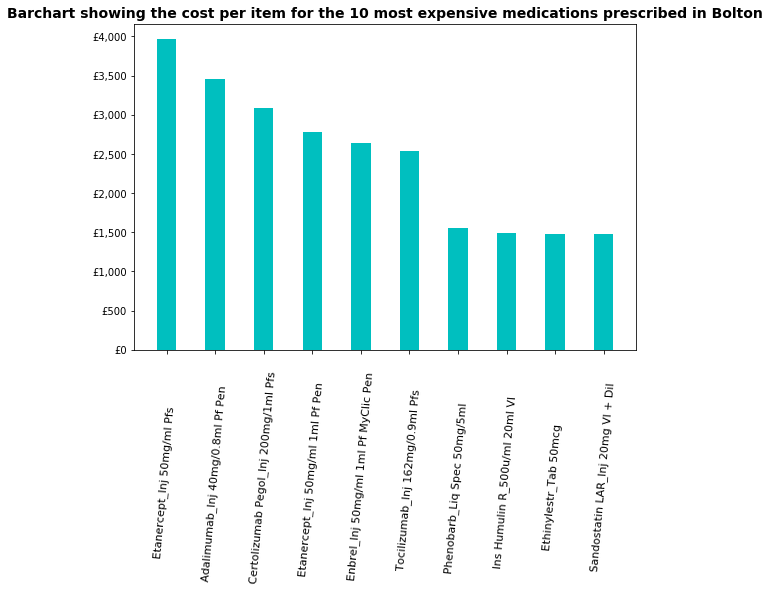

In [17]:
##################################################################################
# Barchart showing ACT COST PER ITEM (£) for the top 10 most expensive medications
##################################################################################

#Create tuples from the dataframe "top_10_Rx_cost_per_item_with_total_spend_bolton" for barchart

df_for_tuples_a3i=top_10_Rx_cost_per_item_bolton.reset_index(drop=True)

med_name_a3i=tuple(df_for_tuples_a3i['BNF NAME'].tolist())
med_cost_per_item_a3i=tuple(df_for_tuples_a3i['ACT COST PER ITEM (£)'].tolist())


ind = np.arange(len(med_cost_per_item_a3i))  # x locations for the groups
width = 0.4  # width of the bars

fig, ax = plt.subplots(figsize=(9, 6))

rects1 = ax.bar(ind,med_cost_per_item_a3i, width,color='c', label='Cost per item')


plt.xticks(rotation=85)
ax.set_title('Barchart showing the cost per item for the 10 most expensive medications prescribed in Bolton', fontsize=14, fontweight='bold')
ax.set_xticks(ind)
ax.set_xticklabels(med_name_a3i, fontsize=11)


##########################
# Format X & Y tick values
##########################

fmt = '£{x:,.0f}'

tick = mtick.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick) 

plt.show()

# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment A </font>
  
# <font size="5"><span style="color:rgb(72, 72, 72)">A (3) ii. The total actual cost of the top ten most expensive medications prescribed in Bolton</font>

In [18]:
#################################################
## Join DataFrame with top 10 most expensive and 
## a shortened version of numerical summary table
#################################################

#short version of numerical summary table calling it "temp_join"

temp_join=Rx_totals_bolton_full.drop(['BNF NAME', 'TOTAL ITEMS DISPENSED',
                                      'TOTAL NET INGREDIENT COST (£)','TOTAL QUANTITY DISPENSED']
                                     , axis=1)

###################################################################
## Combine "top_10_Rx_cost_bolton" with "temp_join" (a'la VLOOKUP)
##################################################################

#LookUp on "BNF CODE"

top_10_Rx_cost_per_item_with_total_spend_bolton = pd.merge(top_10_Rx_cost_per_item_bolton, 
                                                           temp_join, how='left',left_on='BNF CODE', 
                                                           right_on='BNF CODE')
top_10_Rx_cost_per_item_with_total_spend_bolton.index=['Most expensive', '2nd most expensive', 
                                                       '3rd', '4th','5th', '6th','7th','8th', 
                                                       '9th','10th']
                                                       
                                                       
#######################
# Results table styled
#######################

top_10_Rx_cost_per_item_with_total_spend_bolton_styled=top_10_Rx_cost_per_item_with_total_spend_bolton.style.format(
    {'ACT COST PER ITEM (£)': '{:,.0f}'.format, 'TOTAL ACTUAL COST (£)': '{:,.0f}'.format})

top_10_Rx_cost_per_item_with_total_spend_bolton_styled

,BNF CODE,BNF NAME,ACT COST PER ITEM (£),TOTAL ACTUAL COST (£)
Most expensive,1001030D0AAACAC,Etanercept_Inj 50mg/ml Pfs,"3,967","15,867"
2nd most expensive,1001030S0AAABAB,Adalimumab_Inj 40mg/0.8ml Pf Pen,"3,456","89,868"
3rd,1001030Y0AAAAAA,Certolizumab Pegol_Inj 200mg/1ml Pfs,"3,085","9,256"
4th,1001030D0AAAEAE,Etanercept_Inj 50mg/ml 1ml Pf Pen,"2,777","13,884"
5th,1001030D0BBAFAE,Enbrel_Inj 50mg/ml 1ml Pf MyClic Pen,"2,645","2,645"
6th,1001030W0AAADAD,Tocilizumab_Inj 162mg/0.9ml Pfs,"2,533","10,132"
7th,0408010N0AACLCL,Phenobarb_Liq Spec 50mg/5ml,"1,553","1,919"
8th,0601011R0BBABAB,Ins Humulin R_500u/ml 20ml Vl,"1,493","4,478"
9th,0604011D0AAACAC,Ethinylestr_Tab 50mcg,"1,479","1,479"
10th,0803043N0BBAGAG,Sandostatin LAR_Inj 20mg Vl + Dil,"1,478","2,217"


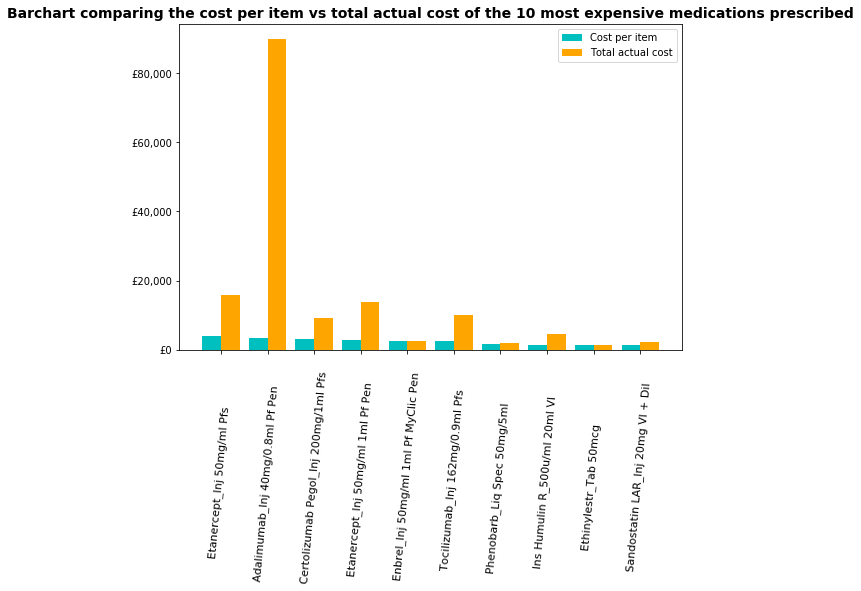

In [19]:
##########################################################################
# Barchart comparing ACT COST PER ITEM (£) with TOTAL ACTUAL COST (£) for 
# top 10 most expensive medications
##########################################################################

#Create tuples from the dataframe "top_10_Rx_cost_per_item_with_total_spend_bolton" for barchart

df_for_tuples_a3ii=top_10_Rx_cost_per_item_with_total_spend_bolton.reset_index(drop=True)

med_name_a3ii=tuple(df_for_tuples_a3ii['BNF NAME'].tolist())
med_cost_per_item_a3ii=tuple(df_for_tuples_a3ii['ACT COST PER ITEM (£)'].tolist())
med_actual_cost_a3ii=tuple(df_for_tuples_a3ii['TOTAL ACTUAL COST (£)'].tolist())

ind = np.arange(len(med_cost_per_item_a3ii))  # x locations for the groups
width = 0.4  # width of the bars

fig, ax = plt.subplots(figsize=(9, 6))

rects1 = ax.bar(ind - width/2,med_cost_per_item_a3ii, width,color='c', label='Cost per item')
rects2 = ax.bar(ind + width/2, med_actual_cost_a3ii, width, color='orange', label='Total actual cost')

plt.xticks(rotation=85)
ax.set_title('Barchart comparing the cost per item vs total actual cost of the 10 most expensive medications prescribed', fontsize=14, fontweight='bold')
ax.set_xticks(ind)
ax.set_xticklabels(med_name_a3ii, fontsize=11)
ax.legend()

##########################
# Format X & Y tick values
##########################

fmt = '£{x:,.0f}'

tick = mtick.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick) 

plt.show()

# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment A </font>
  
# <font size="5"><span style="color:rgb(72, 72, 72)">A (4) Comparing prescribing frequency and costs in Bolton with Cambridge</font>


In [20]:
##################################################################################
## Getting Cambridge numbers need to re-write but I don't have time for this shit!
##################################################################################

#This is for the total number of prescriptions Summing over "ITEMS" column
df_total_number_precriptions_cambridge=pd.DataFrame(df_GP_practice_prescribing_cambridge.groupby('PRACTICE')['ITEMS'].sum())
df_total_number_precriptions_cambridge.columns=['TOTAL NUMBER OF PRESCRIPTIONS']
df_total_number_precriptions_cambridge.reset_index(inplace=True)


#This is for the total cost of prescriptions Summing over "ACT COST" column
df_total_cost_prescritpions_cambridge=pd.DataFrame(df_GP_practice_prescribing_cambridge.groupby('PRACTICE')['ACT COST (£)'].sum())
df_total_cost_prescritpions_cambridge.columns=['TOTAL COST OF PRESCRIPTIONS (£)']
df_total_cost_prescritpions_cambridge.reset_index(inplace=True)

#Combining the total number & total cost of prescriptions

temp_number_cost_prescriptions=pd.merge(df_total_number_precriptions_cambridge,df_total_cost_prescritpions_cambridge)


#A DataFrame with only "PRACTICE" & "PRACTICE NAME" from cambridge DataFrame

temp_presc=df_GP_practice_prescribing_cambridge.loc[:,'PRACTICE':'PRACTICE NAME':8]

#combine temp_number_cost_prescriptions and temp_presc

temp_number_cost_prescriptions_temp_presc=pd.merge(temp_presc,temp_number_cost_prescriptions).drop_duplicates(subset=None, keep='first', inplace=False)

#reindex the above table

QA_4=temp_number_cost_prescriptions_temp_presc.reset_index(drop=True)

##############################################################
## Creating Lists for dataframes
###############################################################

bolton_snapshot=[df_QA_1['TOTAL COST OF PRESCRIPTIONS (£)'].sum(), 
                 df_QA_1['TOTAL NUMBER OF PRESCRIPTIONS'].sum()]


cambridge_snapshot=[QA_4['TOTAL COST OF PRESCRIPTIONS (£)'].sum(), 
                    QA_4['TOTAL NUMBER OF PRESCRIPTIONS'].sum()]

bolton_vs_cambridge_snapshot = pd.DataFrame([bolton_snapshot,cambridge_snapshot],
                 columns=['TOTAL MONTHLY SPEND ON PRESCRIPTIONS (£)','TOTAL NUMBER OF PRESCRIPTIONS'], 
                   index=['Bolton','Cambridge'])


#######################
# Results table styled
#######################

bolton_vs_cambridge_snapshot_styled=bolton_vs_cambridge_snapshot.style.format(
    {'TOTAL MONTHLY SPEND ON PRESCRIPTIONS (£)': '{:,.0f}'.format, 'TOTAL NUMBER OF PRESCRIPTIONS': '{:,.0f}'.format})

bolton_vs_cambridge_snapshot_styled

,TOTAL MONTHLY SPEND ON PRESCRIPTIONS (£),TOTAL NUMBER OF PRESCRIPTIONS
Bolton,"4,693,171","539,693"
Cambridge,"2,929,107","388,548"


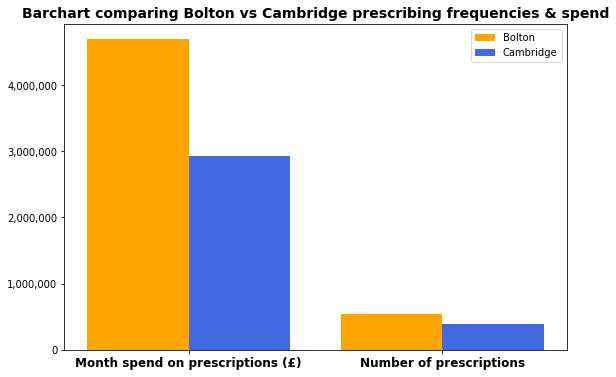

In [21]:
##########################################################################
# Barchart comparing Bolton & Cambridge prescribing frequencies and spend
##########################################################################

#Create tuples from the dataframe "bolton_vs_cambridge_snapshot" for barchart

bolton= bolton_vs_cambridge_snapshot[0:1].apply(tuple, axis=1).tolist()[0] # 1st row as tuple
cambridge = bolton_vs_cambridge_snapshot[1:2].apply(tuple, axis=1).tolist()[0] # 2nd row as tuple

ind = np.arange(len(bolton))  # x locations for the groups
width = 0.4  # width of the bars

fig, ax = plt.subplots(figsize=(9, 6))

rects1 = ax.bar(ind - width/2,bolton, width,color='orange', label='Bolton')
rects2 = ax.bar(ind + width/2, cambridge, width, color='royalblue', label='Cambridge')

ax.set_title('Barchart comparing Bolton vs Cambridge prescribing frequencies & spend', fontsize=14, fontweight='bold')
ax.set_xticks(ind)
ax.set_xticklabels(('Month spend on prescriptions (£)', 'Number of prescriptions'), fontsize=12, fontweight='bold')
ax.legend()

##########################
# Format X & Y tick values
##########################

fmt = '{x:,.0f}'

tick = mtick.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick) 

plt.show()

# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment A </font>

# <font size="5"><span style="color:rgb(72, 72, 72)">A (5) Using SQL to produce a table with the number of GP practices per city, ordered in descending order.</font> 
# <font size="3"><span style="color:rgb(72, 72, 72)">Note: Cities included are only those mentioned in the coursework.</font> 

In [22]:
######################
# SQL for Bolton Only
######################

pdsql = PandaSQL()

sql_query_bolton="""Select count(*) as NUMBER_OF_GP_PRACTICES
             from df_GP_address_ORIG 
              WHERE (POSTCODE LIKE 'BL1%' 
              OR POSTCODE LIKE 'BL2%'OR POSTCODE LIKE 'BL3%' 
              OR POSTCODE LIKE 'BL4%'OR POSTCODE LIKE 'BL5%' 
              OR POSTCODE LIKE 'BL6%'OR POSTCODE LIKE 'BL7%')
              """

df_nbr_gp_bolton=pdsql(sql_query_bolton)
df_nbr_gp_bolton=df_nbr_gp_bolton.rename(index={0: 'BOLTON'})
df_nbr_gp_bolton.head()

,NUMBER_OF_GP_PRACTICES
BOLTON,62


In [23]:
#Set up a DataFrame using a subset of the original data.

df_GP_cities_ORIG = pd.read_csv(url_GP_address, names=col_heads_GP_address, 
                                index_col=False, usecols=['POSTCODE'])

#Remove trailing spaces from data.

df_GP_cities_ORIG = df_GP_cities_ORIG.applymap(lambda x: str(x).strip())
data_frame_trimmed = df_GP_cities_ORIG.applymap(lambda x: str(x).strip() if len(str(x).strip()) else None)

##############################
#short postcodes
###############################

test= pd.DataFrame(data_frame_trimmed['POSTCODE'].astype(str).str[:4]).rename(columns = {'POSTCODE':'PRACTICE_SHORT_POSTCODE'})

df_GP_city_postcodes=test.applymap(lambda x: str(x).strip() if len(str(x).strip()) else None)


##################################################################
# Postcodes of each "city" assigned/ mentioned in this coursework 
#################################################################

birmingham_postcodes = ['B1','B10','B11','B12','B13','B14','B15','B16','B17','B18','B19','B20','B21','B23','B24',
'B25','B26','B27','B28','B29','B30','B31','B32','B33','B34','B35','B36','B37','B38','B4','B42',
'B43','B45','B44','B46','B47','B49','B5','B50','B6','B60','B61','B62','B64','B65','B66','B68',
'B67','B69','B7','B70','B71','B72','B73','B74','B75','B76','B78','B77','B79','B8','B80','B9']

bolton_postcodes = ['BL1','BL2','BL3','BL4','BL5','BL6','BL7']

bournemouth_postcodes = ['BH1','BH2','BH3','BH4','BH5','BH6','BH7','BH8','BH9','BH10','BH11']

bradford_postcodes = ['BD1','BD2','BD3','BD4','BD5','BD6','BD7','BD8','BD9','BD10','BD11','BD12',
                      'BD13','BD14','BD15']

brighton_postcodes = ['BN1','BN2','BN41','BN42','BN45','BN50','BN51','BN88']

bristol_postcodes = ['BS0','BS1','BS10','BS11','BS13','BS14','BS15','BS16','BS2','BS20','BS3','BS30',
                     'BS31','BS32','BS34','BS35','BS36','BS37','BS39','BS4','BS40','BS41','BS48',
                     'BS49','BS5','BS6','BS7','BS8','BS9','BS98']

cambridge_postcodes = ['CB1','CB2','CB3','CB4','CB5','CB21','CB22','CB23','CB24','CB25']

coventry_postcodes = ['CV1','CV2','CV3','CV4','CV5','CV6','CV7','CV8']

doncaster_postcodes = ['DN1','DN2','DN3','DN4','DN5','DN6','DN7','DN8','DN9','DN10','DN11','DN12']

leeds_postcodes =['LS1','LS10','LS11','LS12','LS13','LS14','LS15','LS16','LS17','LS18','LS19',
                  'LS2','LS20','LS25','LS26','LS27','LS3','LS4','LS5','LS6','LS7','LS8',
                  'LS88','LS9','LS98','LS99']

leicester_postcodes = ['LE1','LE2','LE3','LE4','LE5','LE6','LE7','LE8','LE9','LE18','LE19']

liverpool_postcodes = ['L1','L10','L11','L12','L13','L14','L15','L16','L17','L18','L19','L2',
                       'L20','L21','L22','L23','L24','L25','L26','L27','L28','L29','L3','L31',
                       'L32','L33','L36','L37','L38','L4','L5','L6','L67','L68','L69','L7','L70',
                       'L71','L72','L73','L74','L75','L8','L9']

luton_postcodes = ['LU1','LU2','LU3','LU4']

manchester_postcodes = ['M1','M11','M12','M13','M14','M15','M16','M17','M18','M19','M2','M20','M21',
                        'M22','M23','M24','M25','M26','M27','M28','M29','M3','M30','M31','M32','M34',
                        'M35','M38','M4','M40','M41','M43','M44','M45','M46','M60','M60','M60','M60',
                        'M60','M61','M8','M9','M90','M99']

nottingham_postcodes = ['NG1','NG10','NG11','NG12','NG13','NG14','NG15','NG16','NG2','NG3','NG4',
                        'NG5','NG6','NG7','NG8','NG80','NG9','NG90','NG17']

plymouth_postcodes = ['PL1','PL2','PL3','PL4','PL5','PL6','PL7','PL8','PL9','PL95']

portsmouth_postcodes = ['PO1','PO2','PO3','PO4','PO5','PO6','PO7','PO8']

sheffield_postcodes = ['S1','S10','S11','S12','S13','S14','S17','S2','S20','S21','S25','S26','S3',
                       'S35','S36','S4','S5','S6','S7','S8','S9','S95','S96','S98','S99']

southampton_postcodes = ['SO14','SO15','SO16','SO17','SO18','SO19']

wolverhampton_postcodes = ['WV1','WV10','WV11','WV2','WV3','WV4','WV5','WV6','WV7','WV8','WV9','WV98','WV99']



postcode_list=birmingham_postcodes+bolton_postcodes+bournemouth_postcodes+bradford_postcodes+brighton_postcodes+bristol_postcodes+cambridge_postcodes+coventry_postcodes+doncaster_postcodes+leeds_postcodes+leicester_postcodes+liverpool_postcodes+luton_postcodes+manchester_postcodes+nottingham_postcodes+plymouth_postcodes+portsmouth_postcodes+sheffield_postcodes+southampton_postcodes+wolverhampton_postcodes

#########################################
# List of cities mentioned in coursework
##########################################

cities_list=["BIRMINGHAM"]*len(birmingham_postcodes) +["BOLTON"]*len(bolton_postcodes) +["BOURNEMOUTH"]*len(bournemouth_postcodes) +["BRADFORD"]*len(bradford_postcodes) +["BRIGHTON"]*len(brighton_postcodes) +["BRISTOL"]*len(bristol_postcodes) +["CAMBRIDGE"]*len(cambridge_postcodes) +["COVENTRY"]*len(coventry_postcodes) +["DONCASTER"]*len(doncaster_postcodes) +["LEEDS"]*len(leeds_postcodes) +["LEICESTER"]*len(leicester_postcodes) +["LIVERPOOL"]*len(liverpool_postcodes) +["LUTON"]*len(luton_postcodes) +["MANCHESTER"]*len(manchester_postcodes) +["NOTTINGHAM"]*len(nottingham_postcodes) +["PLYMOUTH"]*len(plymouth_postcodes) +["PORTSMOUTH"]*len(portsmouth_postcodes) +["SHEFFIELD"]*len(sheffield_postcodes) +["SOUTHAMPTON"]*len(southampton_postcodes) +["WOLVERHAMPTON"]*len(wolverhampton_postcodes)

###################################################
# A datframe of postcodes with corresponding cities
####################################################

df_cities_postcodes=pd.DataFrame({'POSTCODE': postcode_list, 'CITIES': cities_list})

#df_cities_postcodes.head(3)

In [24]:
#####################################################################
#SQL stuff: Join GP practice short postcodes with corresponding city
#####################################################################

sql_query="""SELECT PRACTICE_SHORT_POSTCODE,CITIES
             FROM df_GP_city_postcodes a
             LEFT OUTER JOIN df_cities_postcodes b 
             ON a.PRACTICE_SHORT_POSTCODE = b.POSTCODE
            
         """
c=pdsql(sql_query)

df_city_of_GP_practice=c.dropna()

#df_city_of_GP_practice.head(3)

In [25]:
##################################
#SQL stuff: Number of GP per city
##################################

#df_city_of_GP_practice

#CITIES

sql_query_2="""select CITIES, count(1) as NUMBER_OF_GP_PRACTICES
               from df_city_of_GP_practice
                group by CITIES 
                 order by NUMBER_OF_GP_PRACTICES desc"""
d=pdsql(sql_query_2)

df_nbr_GP_practices_by_city=d.dropna()

df_nbr_GP_practices_by_city.head(20)


,CITIES,NUMBER_OF_GP_PRACTICES
0,BIRMINGHAM,331
1,MANCHESTER,187
2,NOTTINGHAM,153
3,LEEDS,143
4,LIVERPOOL,129
5,BRISTOL,124
6,LEICESTER,117
7,COVENTRY,103
8,BRADFORD,84
9,PLYMOUTH,67


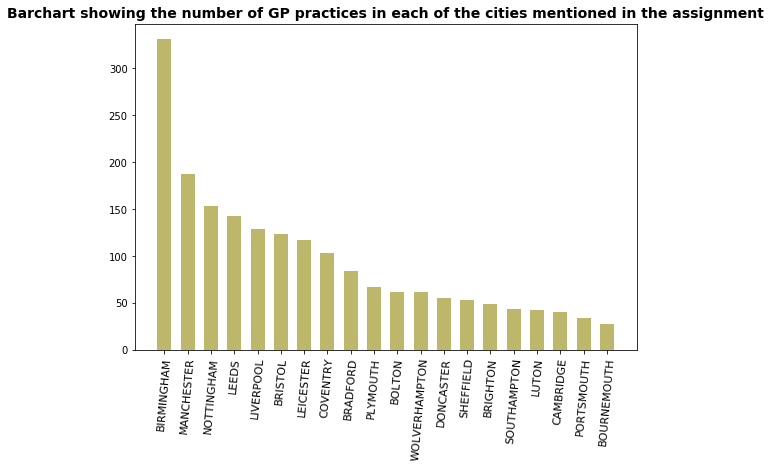

In [26]:
#############################################################
# Barchart showing the number og GP practices in each city
###########################################################

#Create tuples from the dataframe "df_nbr_GP_practices_by_city" for barchart

df_for_tuples_a5=df_nbr_GP_practices_by_city.reset_index(drop=True)

cities_a5=tuple(df_for_tuples_a5['CITIES'].tolist())
nbr_gp_prc_a5=tuple(df_for_tuples_a5['NUMBER_OF_GP_PRACTICES'].tolist())


ind = np.arange(len(nbr_gp_prc_a5))  # x locations for the groups
width = 0.6  # width of the bars

fig, ax = plt.subplots(figsize=(9, 6))

rects1 = ax.bar(ind,nbr_gp_prc_a5, width,color='darkkhaki', label='Number of GP Practices')


plt.xticks(rotation=85)
ax.set_title('Barchart showing the number of GP practices in each of the cities mentioned in the assignment', fontsize=14, fontweight='bold')
ax.set_xticks(ind)
ax.set_xticklabels(cities_a5, fontsize=11)


##########################
# Format X & Y tick values
##########################

fmt = '{x:,.0f}'

tick = mtick.StrMethodFormatter(fmt)
ax.yaxis.set_major_formatter(tick) 

plt.show()

# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment B </font>
# <font size="5"><span style="color:rgb(72, 72, 72)">B (1) Calculating the monthly total spending for each GP-practice.</font> 

In [27]:
#Sum the "ACT COST (£)" column grouped by "PRACTICE"

df_monthly_GP_practice_spend = pd.DataFrame(df_GP_prescribing_ORIG.groupby(df_GP_prescribing_ORIG.PRACTICE).apply(lambda subf: subf['ACT COST (£)'].sum()))


df_monthly_GP_practice_spend.columns = ['MONTHLY PRACTICE SPEND (£)'] # Name the column

df_monthly_GP_practice_spend.reset_index(inplace=True) # Reseting the index


#######################
# Results table styled
#######################

df_monthly_GP_practice_spend_styled=df_monthly_GP_practice_spend.style.format({
    'MONTHLY PRACTICE SPEND (£)': '{:,.0f}'.format})

df_monthly_GP_practice_spend_styled

,PRACTICE,MONTHLY PRACTICE SPEND (£)
0,A81001,"83,221"
1,A81002,"333,515"
2,A81003,"47,977"
3,A81004,"147,495"
4,A81005,"107,670"
5,A81006,"197,437"
6,A81007,"141,781"
7,A81008,"62,464"
8,A81009,"139,613"
9,A81011,"188,196"


# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment B </font>
# <font size="5"><span style="color:rgb(72, 72, 72)">B (2) Calculating the relative costs per patient</font>

In [28]:
df_GP_spend_merge_with_nbrs_raw = pd.merge(df_monthly_GP_practice_spend, df_GP_patient_nbrs_ORIG, 
                                             how='left',left_on='PRACTICE', right_on='PRACTICE')

df_GP_spend_merge_with_nbrs_raw['COST PER PATIENT (£)'] = df_GP_spend_merge_with_nbrs_raw['MONTHLY PRACTICE SPEND (£)']/df_GP_spend_merge_with_nbrs_raw['TOTAL NUMBER OF PATIENTS']

df_GP_spend_merge_with_nbrs=df_GP_spend_merge_with_nbrs_raw.dropna() 

##############################
# Output Results table styled
#############################

df_GP_spend_merge_with_nbrs_display=df_GP_spend_merge_with_nbrs.style.format({'MONTHLY PRACTICE SPEND (£)': '{:,.0f}'.format,
                                                                              'TOTAL NUMBER OF PATIENTS': '{:,.0f}'.format,
                                                                              'COST PER PATIENT (£)': '{:,.2f}'.format})
df_GP_spend_merge_with_nbrs_display

,PRACTICE,MONTHLY PRACTICE SPEND (£),TOTAL NUMBER OF PATIENTS,COST PER PATIENT (£)
0,A81001,"83,221","4,234",19.66
1,A81002,"333,515","19,691",16.94
2,A81003,"47,977","3,357",14.29
3,A81004,"147,495","9,151",16.12
4,A81005,"107,670","7,883",13.66
5,A81006,"197,437","12,345",15.99
6,A81007,"141,781","9,744",14.55
7,A81008,"62,464","4,027",15.51
8,A81009,"139,613","9,175",15.22
9,A81011,"188,196","11,435",16.46


# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment B </font>
# <font size="5"><span style="color:rgb(72, 72, 72)">B (3) Scatterplot with a trend line for GP practices' monthly spending per registered patients</font>

# <font size="3"><span style="color:rgb(72, 72, 72)">(comparing Bolton practices with nation GP practices)</font>

In [29]:
#################################################################
# Work Out monthly spend per patient for Bolton GP practices only
#################################################################

#Sum the "ACT COST (£)" column grouped by "PRACTICE"

df_monthly_bolton_practice_spend = pd.DataFrame(df_GP_practice_prescribing_bolton.groupby(df_GP_practice_prescribing_bolton.PRACTICE).apply(lambda subf: subf['ACT COST (£)'].sum()))


df_monthly_bolton_practice_spend.columns = ['MONTHLY PRACTICE SPEND (£)'] # Name the column

df_monthly_bolton_practice_spend.reset_index(inplace=True) # Reseting the index


df_bolton_spend_merge_with_nbrs_raw = pd.merge(df_monthly_bolton_practice_spend, df_GP_patient_nbrs_ORIG, 
                                             how='left',left_on='PRACTICE', right_on='PRACTICE')

df_bolton_spend_merge_with_nbrs_raw['COST PER PATIENT (£)'] = df_bolton_spend_merge_with_nbrs_raw['MONTHLY PRACTICE SPEND (£)']/df_bolton_spend_merge_with_nbrs_raw['TOTAL NUMBER OF PATIENTS']

df_bolton_spend_merge_with_nbrs=df_bolton_spend_merge_with_nbrs_raw.dropna() 
#df_bolton_spend_merge_with_nbrs.head(2)

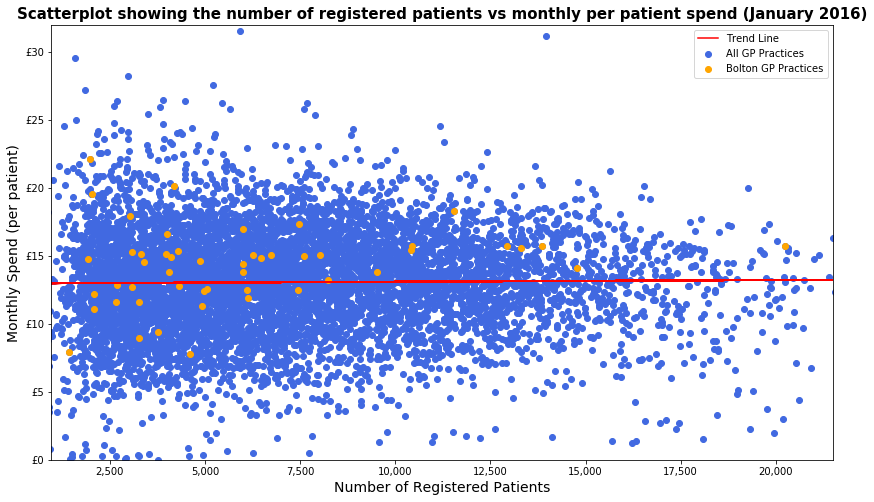

In [30]:
fig=plt.figure(figsize=(14, 8))

ax=fig.add_subplot(111)

x1=df_GP_spend_merge_with_nbrs['TOTAL NUMBER OF PATIENTS']
y1=df_GP_spend_merge_with_nbrs['COST PER PATIENT (£)']

bz1=df_bolton_spend_merge_with_nbrs['TOTAL NUMBER OF PATIENTS']
bz2=df_bolton_spend_merge_with_nbrs['COST PER PATIENT (£)']


#####################################
#Remove outliers for the trendline
#####################################

min_yt = floor(y1.quantile(.01))
max_yt = floor(y1.quantile(.99))

df_pat_nbr_spend = df_GP_spend_merge_with_nbrs.loc[:, ['TOTAL NUMBER OF PATIENTS','COST PER PATIENT (£)']]
df_no_outliers=df_pat_nbr_spend[(df_pat_nbr_spend['COST PER PATIENT (£)']>  min_yt) & (df_pat_nbr_spend['COST PER PATIENT (£)']<  max_yt)]

x1t=df_no_outliers['TOTAL NUMBER OF PATIENTS']
y1t=df_no_outliers['COST PER PATIENT (£)']

############
#Trend line
############

fit = np.polyfit(x1t, y1t, deg=1)

ax.plot(x1t, fit[0] * x1t + fit[1], color='red', alpha=1,label='Trend Line')


######################################
# Scatter Plot for all GP patient nbrs
######################################

ax.scatter(x1, y1, color='royalblue', label='All GP Practices')

#########################################
# Scatter Plot for Bolton GP patient nbrs 
#########################################

ax.scatter(bz1, bz2, color='orange',label='Bolton GP Practices')


ax.set_title('Scatterplot showing the number of registered patients vs monthly per patient spend (January 2016)', 
             fontsize=15, fontweight='bold')
ax.set_xlabel("Number of Registered Patients",fontsize=14)
ax.set_ylabel("Monthly Spend (per patient)",fontsize=14)


max_x = floor(x1.max())+5000
max_y = floor(bz2.max())+10

ax.set_xlim(0, max_x)
ax.set_ylim(0, max_y)

##########################
# Format X & Y tick values
##########################

fmt_pound = '£{x:,.0f}'
fmt_k= '{x:,.0f}'

tick_pound = mtick.StrMethodFormatter(fmt_pound)
tick_k = mtick.StrMethodFormatter(fmt_k)

ax.xaxis.set_major_formatter(tick_k) 
ax.yaxis.set_major_formatter(tick_pound) 

min_x1 = floor(x1.quantile(.01))
max_x1 = floor(x1.quantile(.99))
plt.xlim(min_x1, max_x1) #do not show extreme outliers

plt.legend(loc='best');

# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment B </font>
# <font size="5"><span style="color:rgb(72, 72, 72)">B (4) Histogram showing national GP practices' monthly spending per registered patients</font>


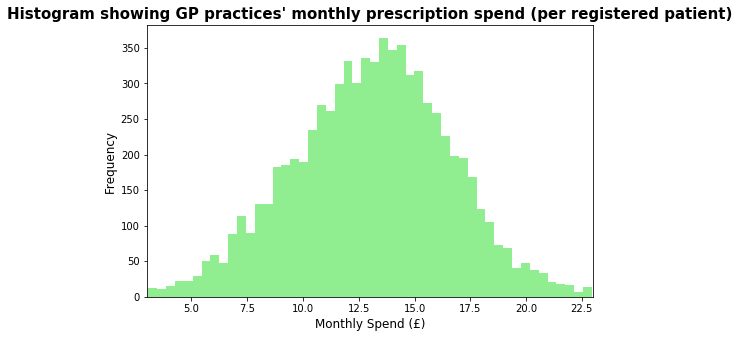

In [31]:
fig=plt.figure(figsize=(8, 5))

x2=df_GP_spend_merge_with_nbrs['COST PER PATIENT (£)']
x2t=df_no_outliers['COST PER PATIENT (£)']

plt.hist(x2t, bins=50, color='lightgreen')

plt.title("Histogram showing GP practices' monthly prescription spend (per registered patient)",fontsize=15, fontweight='bold')
plt.xlabel("Monthly Spend (£)",fontsize=12)
plt.ylabel('Frequency',fontsize=12);


min_x2 = floor(x2.quantile(.01))
max_x2 = floor(x2.quantile(.99))
plt.xlim(min_x2, max_x2) #do not show extreme outliers
plt.show()

# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment B </font>
# <font size="5"><span style="color:rgb(72, 72, 72)">B (5) Comparing Bolton GP practices to the national level using descriptive statistics </font>

In [32]:
############################################################
# Descriptive statistics for GP Practices' spend per patient
############################################################

temp_nation=df_GP_spend_merge_with_nbrs ['COST PER PATIENT (£)'].describe()
temp_bolton=df_bolton_spend_merge_with_nbrs ['COST PER PATIENT (£)'].describe()


df_temp_nation = pd.DataFrame([temp_nation], index=['National Level'])
df_temp_bolton = pd.DataFrame([temp_bolton], index=['Bolton GP Practices'])

df_per_patient_spend_descriptive_stats=pd.concat([df_temp_nation,df_temp_bolton])


pd.options.display.float_format = '{:,.2f}'.format #for display


df_per_patient_spend_descriptive_stats.head()

#df_per_patient_spend_descriptive_stats.dtypes

,count,mean,std,min,25%,50%,75%,max
National Level,"7,701.00",21.32,665.57,0.00,10.69,13.21,15.50,"58,319.78"
Bolton GP Practices,50.00,14.27,2.83,7.78,12.54,14.72,15.58,22.11


In [33]:
#################################################
# Descriptive statistics for GP Practices' monthly spend 
#################################################

temp_nation2=df_GP_spend_merge_with_nbrs_raw ['MONTHLY PRACTICE SPEND (£)'].describe()
temp_bolton2=df_bolton_spend_merge_with_nbrs_raw ['MONTHLY PRACTICE SPEND (£)'].describe()


df_temp_nation2 = pd.DataFrame([temp_nation2], index=['National Level'])
df_temp_bolton2 = pd.DataFrame([temp_bolton2], index=['Bolton GP Practices'])

df_monthly_spend_descriptive_stats=pd.concat([df_temp_nation2,df_temp_bolton2])


pd.options.display.float_format = '{:,.0f}'.format #for display

df_monthly_spend_descriptive_stats.head()

#df_per_patient_spend_descriptive_stats.dtypes

,count,mean,std,min,25%,50%,75%,max
National Level,"9,906","76,989","69,967",0,"21,719","61,983","117,817","923,786"
Bolton GP Practices,62,"75,696","65,599",1,"31,770","60,752","100,311","318,124"


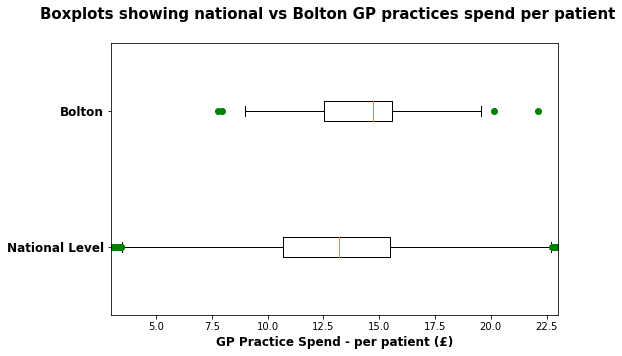

In [34]:
##################################################
# Boxplots for for GP Practices' spend per patient
##################################################

#Need the following in order to avoid warnings when trying to use column values

temp_nation3 = df_GP_spend_merge_with_nbrs ['COST PER PATIENT (£)']
temp_nation_np3 = np.array(temp_nation3)
temp_nation_np3 = temp_nation_np3.reshape([temp_nation3.shape[0], 1]) 

temp_bolton3 = df_bolton_spend_merge_with_nbrs ['COST PER PATIENT (£)']
temp_bolton_np3 = np.array(temp_bolton3)
temp_bolton_np3 = temp_bolton_np3.reshape([temp_bolton3.shape[0], 1]) 



fig=plt.figure(figsize=(8, 5))

fig.suptitle('Boxplots showing national vs Bolton GP practices spend per patient', fontsize=15, fontweight='bold')

#plt.boxplot([df_GP_spend_merge_with_nbrs ['COST PER PATIENT (£)'],
             #df_bolton_spend_merge_with_nbrs ['COST PER PATIENT (£)']], 0, 'g', 0) This code gives warnings!

plt.boxplot([temp_nation_np3,temp_bolton_np3], 0, 'g', 0)
    
plt.xlabel('GP Practice Spend - per patient (£)', fontsize=12, fontweight='bold')
plt.yticks([1,2],['National Level', 'Bolton'], fontsize=12, fontweight='bold')

min_x3 = floor(df_GP_spend_merge_with_nbrs ['COST PER PATIENT (£)'].quantile(.01))
max_x3 = floor(df_GP_spend_merge_with_nbrs ['COST PER PATIENT (£)'].quantile(.99))
plt.xlim(min_x3, max_x3) #do not show extreme outliers

plt.show()

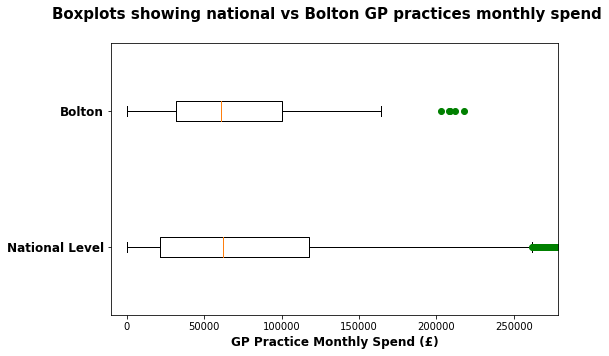

In [35]:
##################################################
# Boxplots for for GP Practices' spend per month
##################################################

#Need the following in order to avoid warnings when trying to use column values

temp_nation4 = df_GP_spend_merge_with_nbrs_raw ['MONTHLY PRACTICE SPEND (£)']
temp_nation_np4 = np.array(temp_nation4)
temp_nation_np4 = temp_nation_np4.reshape([temp_nation4.shape[0], 1]) 

temp_bolton4 = df_bolton_spend_merge_with_nbrs_raw ['MONTHLY PRACTICE SPEND (£)']
temp_bolton_np4 = np.array(temp_bolton4)
temp_bolton_np4 = temp_bolton_np4.reshape([temp_bolton4.shape[0], 1]) 



fig=plt.figure(figsize=(8, 5))

fig.suptitle('Boxplots showing national vs Bolton GP practices monthly spend', fontsize=15, fontweight='bold')


plt.boxplot([temp_nation_np4,temp_bolton_np4], 0, 'g', 0)
    
plt.xlabel('GP Practice Monthly Spend (£)', fontsize=12, fontweight='bold')
plt.yticks([1,2],['National Level', 'Bolton'], fontsize=12, fontweight='bold')

min_x4 = floor(df_GP_spend_merge_with_nbrs_raw ['MONTHLY PRACTICE SPEND (£)'].quantile(.01))-10000
max_x4 = floor(df_GP_spend_merge_with_nbrs_raw ['MONTHLY PRACTICE SPEND (£)'].quantile(.99))
plt.xlim(min_x4, max_x4) #do not show extreme outliers

plt.show()


# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment C </font>

# <font size="6"> <span style="color:rgb(72, 72, 72)"> Read in Data </font>
<font size="5"> <span style="color:rgb(72, 72, 72)"> ONS Postcode Data </font>

In [36]:
#####################################################################
## Read in the "ONS Postcode Lookup" data & setup a pandas dataframe
#####################################################################

# Store the url of the data as a variable
url_ons_postcodes = 'https://s3.eu-west-2.amazonaws.com/dmhr-data/postcodes.csv'

#Set up a DataFrame using a subset of the original data.
df_ons_postcodes_ORIG= pd.read_csv(url_ons_postcodes, index_col=False, 
                                   usecols=['Postcode 1','Postcode 2', 'Postcode 3','Region Name'])

#Rename column headings
df_ons_postcodes_ORIG.rename(columns={'Postcode 1':'POSTCODE 1','Postcode 2':'POSTCODE 2', 
                                      'Postcode 3':'POSTCODE 3','Region Name':'REGION NAME'}, 
                             inplace=True)


#Remove trailing spaces from data.
#df_ons_postcodes_ORIG = df_ons_postcodes_ORIG.applymap(lambda x: str(x).strip() if len(str(x).strip()) else None)

df_ons_postcodes_ORIG.head(1)

,POSTCODE 1,POSTCODE 2,POSTCODE 3,REGION NAME
0,S20 6RU,S20 6RU,S20 6RU,Yorkshire and The Humber


# <font size="6"> <span style="color:rgb(72, 72, 72)"> Read in Data </font>
<font size="5"> <span style="color:rgb(72, 72, 72)"> Deprivation Indices Data </font>

In [37]:
############################################################################
## Read in the "English deprivation indices" data & setup a pandas dataframe
############################################################################

# Store the url of the data as variables
url_eng_deprivation_indices = 'https://s3.eu-west-2.amazonaws.com/dmhr-data/deprivation-by-postcode.csv'

#Set up a DataFrame using a subset of the original data.
df_eng_deprivation_indices_ORIG= pd.read_csv(url_eng_deprivation_indices, 
                                             index_col=False, 
                                             usecols=['Postcode','Postcode Status',
                                                      'LSOA code','LSOA Name',
                                                      'Index of Multiple Deprivation Rank',
                                                      'Index of Multiple Deprivation Decile'])
#Rename column headings
df_eng_deprivation_indices_ORIG.rename(columns={'Postcode':'POSTCODE',
                                                'Postcode Status':'POSTCODE STATUS',
                                                'LSOA code':'LSOA CODE',
                                                'LSOA Name':'LSOA NAME',
                                                'Index of Multiple Deprivation Rank':'IMD RANK',
                                                'Index of Multiple Deprivation Decile':'IMD DECILE'}, 
                                       inplace=True)

df_eng_deprivation_indices_ORIG = df_eng_deprivation_indices_ORIG.dropna() 

#Remove trailing spaces from data.
df_eng_deprivation_indices_ORIG = df_eng_deprivation_indices_ORIG.applymap(lambda x: str(x).strip())

# Drop rows for which no entries in csv file this for 10 postcodes that are **UNMATCHED**
df_eng_deprivation_indices_ORIG = df_eng_deprivation_indices_ORIG.dropna() 

#Reformat columns that were converted into Objects in the process of removing white space
#They get formatted into float64

df_eng_deprivation_indices_ORIG['IMD RANK'] = pd.to_numeric(df_eng_deprivation_indices_ORIG['IMD RANK'])
df_eng_deprivation_indices_ORIG['IMD DECILE'] = pd.to_numeric(df_eng_deprivation_indices_ORIG['IMD DECILE'])

df_eng_deprivation_indices_ORIG.head(1)

,POSTCODE,POSTCODE STATUS,LSOA CODE,LSOA NAME,IMD RANK,IMD DECILE
0,TS18 1HU,Live,E01033477,Stockton-on-Tees 014G E01033477,73,1


# <font size="6"> <span style="color:rgb(72, 72, 72)"> Read in Data </font>
<font size="5"> <span style="color:rgb(72, 72, 72)"> CVD Mortality Rates Data </font>

In [38]:
#############################################################################
## Read in the "Under 75 CVD mortality rates" data & setup a pandas dataframe
#############################################################################

# Store the url of the data as variables

url_mort_rates = 'https://s3.eu-west-2.amazonaws.com/dmhr-data/NHSOF_1.1_I00656_D.csv'

#Set up a DataFrame using all original data.

df_mort_rates_ORIG= pd.read_csv(url_mort_rates)

#Rename column headings

df_mort_rates_ORIG.rename(columns={'Year':'YEAR','Period of coverage':'PERIOD OF COVERAGE',
                                   'Breakdown':'BREAKDOWN','Level':'LEVEL',
                                   'Level description':'LEVEL DESCRIPTION','Gender':'GENDER',
                                   'Age':'AGE','Indicator value':'INDICATOR VALUE',
                                   'Lower CI':'LOWER CI','Upper CI':'UPPER CI',
                                   'Numerator':'NUMERATOR','Denominator':'DENOMINATOR'}, 
                          inplace=True)


#Remove trailing spaces from data.

df_mort_rates_ORIG = df_mort_rates_ORIG.applymap(lambda x: str(x).strip())

#Reformat columns that were converted into Objects in the process of removing white space
#They get formatted into int64 an float64

df_mort_rates_ORIG['YEAR'] = pd.to_numeric(df_mort_rates_ORIG['YEAR']) 

df_mort_rates_ORIG['INDICATOR VALUE'] = pd.to_numeric(df_mort_rates_ORIG['INDICATOR VALUE'].str.replace(r'[,]','')).astype(np.float64) 
df_mort_rates_ORIG['LOWER CI'] = pd.to_numeric(df_mort_rates_ORIG['LOWER CI'].str.replace(r'[,]','')).astype(np.float64)
df_mort_rates_ORIG['UPPER CI'] = pd.to_numeric(df_mort_rates_ORIG['UPPER CI'].str.replace(r'[,]','')).astype(np.float64)
df_mort_rates_ORIG['NUMERATOR'] = pd.to_numeric(df_mort_rates_ORIG['NUMERATOR'].str.replace(r'[,]','')).astype(np.float64)
df_mort_rates_ORIG['DENOMINATOR'] = pd.to_numeric(df_mort_rates_ORIG['DENOMINATOR'].str.replace(r'[,]','')).astype(np.float64)
 
df_mort_rates_ORIG.head(1)

,YEAR,PERIOD OF COVERAGE,BREAKDOWN,LEVEL,LEVEL DESCRIPTION,GENDER,AGE,INDICATOR VALUE,LOWER CI,UPPER CI,NUMERATOR,DENOMINATOR
0,2016,1/1/2016 to 31/12/2016,England,England,England,Person,All,73,72,74,"33,816","50,798,600"


# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment C </font>
# <font size="5"><span style="color:rgb(72, 72, 72)">C (1) The relative costs per patient for all statin prescriptions [simvastatin, atorvastatin, rosuvastatin, pravastatin, fluvastatin] for all GP-practices [December 2015 dataset] </font>

In [39]:
################################
# A list of statin prescriptons
################################

statin_list='Simvastatin|Atorvastatin|Rosuvastatin|Pravastatin|Fluvastatin'

###########################################################################
# Modify "df_GP_prescribing_ORIG" to consider only prescriptions of statins
###########################################################################


df_GP_prescribing_statins = df_GP_prescribing_ORIG[df_GP_prescribing_ORIG['BNF NAME'].str.contains(statin_list, case=False)]

#df_GP_prescribing_statins.head(3)


In [40]:
#This is for the total cost of statin prescriptions Summing over "ACT COST" column

df_total_cost_statin_prescritpions=pd.DataFrame(df_GP_prescribing_statins.groupby('PRACTICE')['ACT COST (£)'].sum())
df_total_cost_statin_prescritpions.columns=['TOTAL COST OF STATIN PRESCRIPTIONS (£)']
df_total_cost_statin_prescritpions.reset_index(inplace=True)

#df_total_cost_statin_prescritpions.head()

#df_total_cost_statin_prescritpions['TOTAL COST OF STATIN PRESCRIPTIONS (£)'].sum()

In [41]:
######################################################################################################
# Combine "df_total_cost_statin_prescritpions" with number of patients with "df_GP_patient_nbrs_ORIG"
######################################################################################################

df_statin_patient_nbr_merged_raw = pd.merge(df_GP_patient_nbrs_ORIG, df_total_cost_statin_prescritpions, 
                                        how='left',left_on='PRACTICE', right_on='PRACTICE')

#Drop Null Rows

df_statin_patient_nbr_merged=df_statin_patient_nbr_merged_raw.dropna() 


In [42]:
#############################################################################################
# Getting warnning when trying df['new column name'] = df['column name1']/df['column name2']
#so have to go from first principles as below
#############################################################################################

df = pd.DataFrame(df_statin_patient_nbr_merged['TOTAL COST OF STATIN PRESCRIPTIONS (£)']/df_statin_patient_nbr_merged['TOTAL NUMBER OF PATIENTS'],
                 columns = ['STATIN COST PER PATIENT (£)'])     

##############################################################
# Relative costs per patient for all statin prescriptions 
# Taking the average over all patients registered at practice
##############################################################

df_statin_cost_per_patient= df_statin_patient_nbr_merged.join(df)


#######################
# Results table styled
#######################

df_statin_cost_per_patient_styled=df_statin_cost_per_patient.style.format({
    'TOTAL NUMBER OF PATIENTS': '{:,.0f}'.format,
    'TOTAL COST OF STATIN PRESCRIPTIONS (£)': '{:,.0f}'.format,'STATIN COST PER PATIENT (£)': '{:,.2f}'.format})

df_statin_cost_per_patient_styled

,PRACTICE,TOTAL NUMBER OF PATIENTS,TOTAL COST OF STATIN PRESCRIPTIONS (£),STATIN COST PER PATIENT (£)
0,A81001,"4,234","1,817",0.43
1,A81002,"19,691","6,514",0.33
2,A81003,"3,357",868,0.26
3,A81004,"9,151","2,135",0.23
4,A81005,"7,883","1,887",0.24
5,A81006,"12,345","4,075",0.33
6,A81007,"9,744","2,246",0.23
7,A81008,"4,027","1,398",0.35
8,A81009,"9,175","1,588",0.17
9,A81011,"11,435","2,946",0.26


# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment C </font>
# <font size="5"><span style="color:rgb(72, 72, 72)">C (2) The associated Index of Multiple Deprivation (IMD) for each GP-Practice in Bolton</font>

In [43]:
################################################################
# Modify "df_GP_address_ORIG" to consider only Bolton postcodes
################################################################

df_GP_address_bolton_postcodes = df_GP_address_ORIG[df_GP_address_ORIG['POSTCODE'].str.contains('BL1|BL2|BL3|BL4|BL5|BL6|BL7', case=False)]

#df_GP_address_bolton_postcodes.head(2)

In [44]:
######################################################################
# Modify the IMD table to keep only relevant columns for this analysis
######################################################################

df_eng_deprivation_indices=df_eng_deprivation_indices_ORIG.drop(['POSTCODE STATUS','LSOA CODE','LSOA NAME'], axis=1)

#df_eng_deprivation_indices.head(2)

In [45]:
################################################################################
# Associated Index of Multiple Deprivation (IMD) for each GP-Practice in England.
# Merging "df_eng_deprivation_indices" and "df_GP_address_ORIG"
################################################################################

df_eng_GP_deprivation_indices=pd.merge(df_GP_address_ORIG, df_eng_deprivation_indices, 
                                       how='left',left_on='POSTCODE', right_on='POSTCODE')

df_eng_GP_deprivation_indices=df_eng_GP_deprivation_indices.drop_duplicates(subset=['PRACTICE'], keep='first')

#######################
# Drop all Null Values
#######################

df_eng_GP_deprivation_indices_raw=df_eng_GP_deprivation_indices.dropna()

df_eng_GP_deprivation_indices=df_eng_GP_deprivation_indices_raw.reset_index(drop=True)

In [46]:
################################################################################
# Associated Index of Multiple Deprivation (IMD) for each GP-Practice in Bolton.
# Merging "df_eng_deprivation_indices" and "df_GP_address_bolton_postcodes"
################################################################################

df_bolton_deprivation_indices_raw=pd.merge(df_GP_address_bolton_postcodes, df_eng_deprivation_indices, 
                                       how='left',left_on='POSTCODE', right_on='POSTCODE')

df_bolton_deprivation_indices_raw=df_bolton_deprivation_indices_raw.drop_duplicates(subset=['PRACTICE'], keep='first')

df_bolton_deprivation_indices=df_bolton_deprivation_indices_raw.reset_index(drop=True)

#######################
# Results table styled
#######################

df_bolton_deprivation_indices_styled=df_bolton_deprivation_indices.style.format({
    'IMD RANK': '{:,.0f}'.format,
    'IMD DECILE': '{:,.0f}'.format})

df_bolton_deprivation_indices_styled

,PRACTICE,PRACTICE NAME,POSTCODE,IMD RANK,IMD DECILE
0,P82001,THE DUNSTAN PARTNERSHIP,BL2 6NT,"3,900",2
1,P82002,PIKES LANE 1,BL3 5HP,"4,389",2
2,P82003,KILDONAN HOUSE,BL6 5NW,"18,170",6
3,P82004,SWAN LANE MEDICAL CENTRE,BL3 6TL,"7,372",3
4,P82005,STABLE FOLD SURGERY,BL5 3SF,"17,059",6
5,P82006,DR MALHOTRA & PARTNERS,BL6 7AS,"15,089",5
6,P82007,KEARSLEY MEDICAL CENTRE,BL4 8EP,"8,370",3
7,P82008,STONEHILL MEDICAL CENTRE,BL4 9QZ,"6,966",3
8,P82009,ST HELENS ROAD PRACTICE,BL3 3RR,"13,656",5
9,P82010,DALEFIELD SURGERY,BL1 4JP,"1,294",1


# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment C </font>
# <font size="5"><span style="color:rgb(72, 72, 72)">C (3) i. The lowest relative spenders on statins from the first decile and the highest relative spenders on statins from the last decile from the entire national dataset</font>

In [47]:
#########################################################
# Place values of relative spend on statins into deciles
#########################################################


df_statin_cost_per_patient['Decile'] = pd.qcut(df_statin_cost_per_patient['STATIN COST PER PATIENT (£)'],
                                                                    10, labels=False)
#df_statin_cost_per_patient.head()

In [48]:
#######################################################
# Lowest relative spenders on statins from first decile
#######################################################

df_statin_cost_per_patient_first_decile = df_statin_cost_per_patient[df_statin_cost_per_patient.Decile== 9]

df_statin_cost_per_patient_first_decile_low_to_high_raw=df_statin_cost_per_patient_first_decile.sort_values(by=['STATIN COST PER PATIENT (£)'], ascending=True)

df_statin_cost_per_patient_first_decile_low_to_high=df_statin_cost_per_patient_first_decile_low_to_high_raw.reset_index(drop=True)

#######################
# Results table styled
#######################

df_statin_cost_per_patient_first_decile_low_to_high_styled=df_statin_cost_per_patient_first_decile_low_to_high.style.format({
    'TOTAL NUMBER OF PATIENTS': '{:,.0f}'.format,
    'TOTAL COST OF STATIN PRESCRIPTIONS (£)': '{:,.0f}'.format,
     'STATIN COST PER PATIENT (£)': '{:,.2f}'.format,
    'Decile': '{:,.0f}'.format})

df_statin_cost_per_patient_first_decile_low_to_high_styled

,PRACTICE,TOTAL NUMBER OF PATIENTS,TOTAL COST OF STATIN PRESCRIPTIONS (£),STATIN COST PER PATIENT (£),Decile
0,P81633,"3,083","1,052",0.34,9
1,L83145,"2,775",947,0.34,9
2,G81004,"10,539","3,597",0.34,9
3,P84012,"10,654","3,637",0.34,9
4,L84026,"10,165","3,470",0.34,9
5,D82629,"3,503","1,196",0.34,9
6,A88015,"7,352","2,510",0.34,9
7,P82031,"10,423","3,560",0.34,9
8,P81073,"10,929","3,733",0.34,9
9,C83649,"4,330","1,479",0.34,9


In [49]:
########################################################
# Highest relative spenders on statins from last decile
########################################################


df_statin_cost_per_patient_last_decile = df_statin_cost_per_patient[df_statin_cost_per_patient.Decile== 0]

df_statin_cost_per_patient_last_decile_high_to_low_raw=df_statin_cost_per_patient_last_decile.sort_values(by=['STATIN COST PER PATIENT (£)'], ascending=False)

df_statin_cost_per_patient_last_decile_high_to_low=df_statin_cost_per_patient_last_decile_high_to_low_raw.reset_index(drop=True)

#######################
# Results table styled
#######################

df_statin_cost_per_patient_last_decile_high_to_low_styled=df_statin_cost_per_patient_last_decile_high_to_low.style.format({
    'TOTAL NUMBER OF PATIENTS': '{:,.0f}'.format,
    'TOTAL COST OF STATIN PRESCRIPTIONS (£)': '{:,.0f}'.format,
     'STATIN COST PER PATIENT (£)': '{:,.2f}'.format,
    'Decile': '{:,.0f}'.format})

df_statin_cost_per_patient_last_decile_high_to_low_styled


,PRACTICE,TOTAL NUMBER OF PATIENTS,TOTAL COST OF STATIN PRESCRIPTIONS (£),STATIN COST PER PATIENT (£),Decile
0,H84623,"9,003","1,101",0.12,0
1,H83002,"2,790",341,0.12,0
2,H84039,"10,497","1,284",0.12,0
3,Y00568,"3,460",423,0.12,0
4,A86003,"32,431","3,965",0.12,0
5,E82603,"2,401",293,0.12,0
6,M86613,"2,925",357,0.12,0
7,B86019,"9,218","1,126",0.12,0
8,F83682,"1,791",219,0.12,0
9,H81029,"12,064","1,473",0.12,0


# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment C </font>
# <font size="5"><span style="color:rgb(72, 72, 72)">C (3) ii. The associated Index of Multiple Deprivation (IMD) for all identified GP-practices for both groups (lowest and the highest), assessing whether the IMD-score differs. </font>

In [50]:
#######################################################
# First decile associated Index of Multiple Deprivation
#######################################################


df_first_decile_statin_spend_and_IMD=pd.merge(df_statin_cost_per_patient_first_decile_low_to_high, 
                                              df_eng_GP_deprivation_indices, 
                                       how='left',left_on='PRACTICE', right_on='PRACTICE')

df_first_decile_statin_spend_and_IMD_all=df_first_decile_statin_spend_and_IMD.drop_duplicates(subset=['PRACTICE'], keep='first')

df_first_decile_statin_spend_and_IMD=df_first_decile_statin_spend_and_IMD_all.drop(['PRACTICE NAME','POSTCODE'], axis=1)

#df_first_decile_statin_spend_and_IMD.head()

In [51]:
#######################################################
# Last decile associated Index of Multiple Deprivation
#######################################################

df_last_decile_statin_spend_and_IMD=pd.merge(df_statin_cost_per_patient_last_decile_high_to_low, 
                                              df_eng_GP_deprivation_indices, 
                                       how='left',left_on='PRACTICE', right_on='PRACTICE')

df_last_decile_statin_spend_and_IMD_all=df_last_decile_statin_spend_and_IMD.drop_duplicates(subset=['PRACTICE'], keep='first')

df_last_decile_statin_spend_and_IMD=df_last_decile_statin_spend_and_IMD_all.drop(['PRACTICE NAME','POSTCODE'], axis=1)

#df_last_decile_statin_spend_and_IMD.head()

In [52]:
##########################################
# Descriptive statistics for IMD scores
##########################################

temp_last=df_last_decile_statin_spend_and_IMD ['IMD RANK'].describe()
temp_first=df_first_decile_statin_spend_and_IMD ['IMD RANK'].describe()


df_temp_first = pd.DataFrame([temp_first], index=['First Decile'])
df_temp_last = pd.DataFrame([temp_last], index=['Last Decile'])


df_IMD_deciles_descriptive_stats=pd.concat([df_temp_first,df_temp_last])

pd.options.display.float_format = '{:,.0f}'.format #for display

df_IMD_deciles_descriptive_stats.head()


,count,mean,std,min,25%,50%,75%,max
First Decile,768,"13,806","9,185",43,"5,458","12,928","21,522","32,639"
Last Decile,768,"12,266","8,901",27,"5,026","9,925","18,880","32,837"


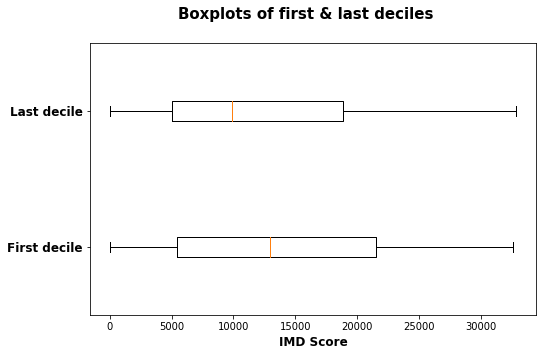

In [53]:
####################################################
# Boxplots for IMD scores of first and last deciles
###################################################

#Need the following in order to avoid warnings when trying to use column values

temp_first = df_first_decile_statin_spend_and_IMD['IMD RANK']
temp_first_np = np.array(temp_first)

temp_last = df_last_decile_statin_spend_and_IMD['IMD RANK']
temp_last_np = np.array(temp_last)

fig=plt.figure(figsize=(8, 5))

fig.suptitle('Boxplots of first & last deciles', fontsize=15, fontweight='bold')

plt.boxplot([temp_first_np,temp_last_np], 0, 'g', 0)
    
plt.xlabel('IMD Score', fontsize=12, fontweight='bold')
plt.yticks([1,2],['First decile', 'Last decile'], fontsize=12, fontweight='bold')


plt.show()

# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment C </font>
# <font size="5"><span style="color:rgb(72, 72, 72)">C (4) GP-practices & their regions together with the associated 75 mortality rate for cardiovascular diseases for the year 2015 for each region. </font>


In [54]:
###########################################################################
# Here I modify "df_mort_rates_ORIG" to consider only regions & 2015
###########################################################################

mort_year=df_mort_rates_ORIG['YEAR']
mort_breakdown=df_mort_rates_ORIG['BREAKDOWN']
mort_gender=df_mort_rates_ORIG['GENDER']
mort_age=df_mort_rates_ORIG['AGE']

df_mort_rates_Raw= df_mort_rates_ORIG.loc[(mort_year == 2015) & (mort_breakdown == 'Region')
                                       & (mort_gender == 'Person') & (mort_age == 'All')
                                       , ["LEVEL DESCRIPTION","NUMERATOR","DENOMINATOR"]] 
##############################
#
#####################################
series_temp_rates=df_mort_rates_Raw['NUMERATOR']/df_mort_rates_Raw['DENOMINATOR']

df_temp_rates = pd.DataFrame(series_temp_rates, columns = ['MORTALITY RATES'])  

###################################
#
##################################

df_mort_rates_for_Q_temp = pd.concat([df_mort_rates_Raw,df_temp_rates], axis=1)
df_mort_rates_for_Q_temp = df_mort_rates_for_Q_temp.rename(columns={'LEVEL DESCRIPTION': 'REGION'})


#########################################
# Drop Numerator & Denominator Colummns
#########################################

df_mort_rates_for_Q_raw=df_mort_rates_for_Q_temp.drop(['NUMERATOR','DENOMINATOR'], axis=1)

df_mort_rates_for_Q = df_mort_rates_for_Q_raw.reset_index(drop=True)

#######################
# Results table styled
#######################

df_mort_rates_for_Q_styled=df_mort_rates_for_Q.style.format({
    'MORTALITY RATES': '{:,.4%}'.format})

df_mort_rates_for_Q_styled

,REGION,MORTALITY RATES
0,East Midlands,0.0739%
1,East of England,0.0632%
2,London,0.0492%
3,North East,0.0834%
4,North West,0.0821%
5,South East,0.0571%
6,South West,0.0672%
7,West Midlands,0.0717%
8,Yorkshire and The Humber,0.0762%


# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment C </font>
# <font size="5"><span style="color:rgb(72, 72, 72)">C (5) A Visualisation (using matplotlib) of each region's spending on statins [x-axis] and the mortality rate [y-axis]. Assessing whether relative spending for statin prescriptions in each regions correlates with the mortality rate from cardiovascular diseases. </font>

In [55]:
################################################################
# Merge "df_statin_patient_nbr_merged" and "df_GP_address_ORIG"
################################################################

df_merge_c5 = pd.merge(df_statin_patient_nbr_merged,df_GP_address_ORIG, how='left',
                                          left_on='PRACTICE', right_on='PRACTICE')

####################################
# Remove blank spaces from postcodes
####################################

series_GP_postcode_no_blanks=df_merge_c5['POSTCODE'].str.replace(' ', '')
df_GP_postcode_no_blanks = pd.DataFrame(series_GP_postcode_no_blanks)  

##################################################
#Drop postcodes and merge postcodes with no blanks
##################################################

df_merge_c5_short=df_merge_c5.drop(['PRACTICE NAME','POSTCODE'], axis=1)

statin_spend_postcodes_no_blanks= pd.concat([df_merge_c5_short, df_GP_postcode_no_blanks], axis = 1)
#statin_spend_postcodes_no_blanks.head()

In [56]:
###########################################################
# Modify "df_ons_postcodes_ORIG" to include mortality rates
###########################################################

df_ons_postcodes_with_mort_rates_raw = pd.merge(df_ons_postcodes_ORIG, df_mort_rates_for_Q, how='left',
                                          left_on='REGION NAME', right_on='REGION')

####################################
# Remove blank spaces from postcodes
####################################

series_ons_postcode_no_blanks=df_ons_postcodes_with_mort_rates_raw['POSTCODE 1'].str.replace(' ', '')

df_ons_postcode_no_blanks = pd.DataFrame(series_ons_postcode_no_blanks)  

##################################################
#Drop postcodes and merge postcodes with no blanks
##################################################

df_ons_postcodes_with_mort_rates_short=df_ons_postcodes_with_mort_rates_raw.drop(['POSTCODE 1','POSTCODE 2',
                                                                                  'POSTCODE 3', 'REGION NAME'], axis=1)

test_c5= pd.concat([df_ons_postcodes_with_mort_rates_short, df_ons_postcode_no_blanks], axis = 1)

test= pd.merge(statin_spend_postcodes_no_blanks, test_c5, how='left',
                                          left_on=['POSTCODE'], right_on=['POSTCODE 1'])

In [57]:
#####################################################################################
# 289 null values out of 764 values due to postcodes from surgery addresses not 
# matching ONS postcodes Will impute values of null matching postcodes using 'ffill'
# The 'ffill' option to 'forward fill' and propagate last valid observation forward
#####################################################################################

df_a=test.sort_values(by=['POSTCODE'])

df_b=df_a.fillna(method='ffill')

df_c = df_b.sort_values(by=['PRACTICE'])

df_d=df_c.drop(['PRACTICE','POSTCODE','POSTCODE','POSTCODE 1'], axis=1)

#This is for the total spend on statin prescriptions 
#Summing over "TOTAL COST OF STATIN PRESCRIPTIONS (£)" column

df_g = df_d.groupby(['REGION','MORTALITY RATES']).sum().reset_index()

#######################################
# Find total regional spend on statins
#######################################

df_n=df_g.drop(['TOTAL NUMBER OF PATIENTS',], axis=1)

##################################
# Find regional spend per patient
#################################

df_h=df_g['TOTAL COST OF STATIN PRESCRIPTIONS (£)']/df_g['TOTAL NUMBER OF PATIENTS']
df_j = pd.DataFrame(df_h, columns = ['REGIONAL STATIN SPEND PER PATIENT'])  

#########################################################################
# Drop TOTAL COST OF STATIN PRESCRIPTIONS (£) & TOTAL NUMBER OF PATIENTS
#########################################################################

df_k=df_g.drop(['TOTAL COST OF STATIN PRESCRIPTIONS (£)','TOTAL NUMBER OF PATIENTS',], axis=1)


df_m= pd.concat([df_k, df_j], axis = 1)

df_m

#######################
# Results table styled
#######################

df_m_styled=df_m.style.format({
    'MORTALITY RATES': '{:,.4%}'.format,
    'REGIONAL STATIN SPEND PER PATIENT': '£{:,.2f}'.format})

df_m_styled

,REGION,MORTALITY RATES,REGIONAL STATIN SPEND PER PATIENT
0,East Midlands,0.0739%,£0.22
1,East of England,0.0632%,£0.21
2,London,0.0492%,£0.17
3,North East,0.0834%,£0.26
4,North West,0.0821%,£0.25
5,South East,0.0571%,£0.22
6,South West,0.0672%,£0.24
7,West Midlands,0.0717%,£0.23
8,Yorkshire and The Humber,0.0762%,£0.26


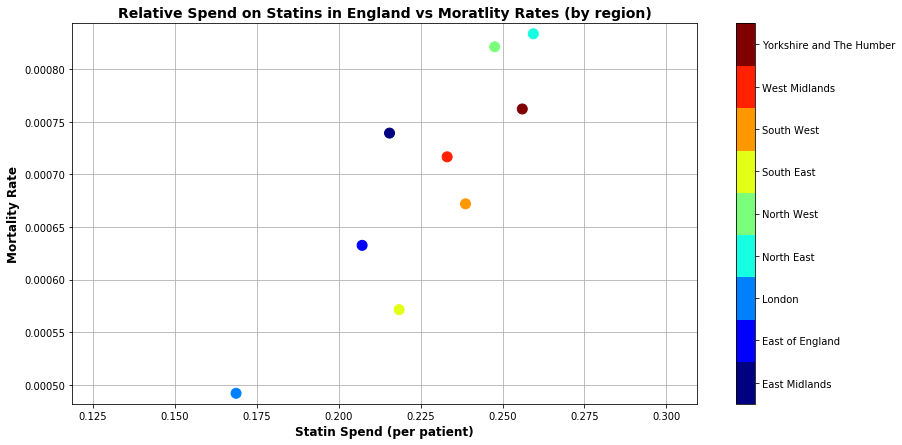

In [58]:
####################################################
# Plot total relative spend on statins vs mortality
####################################################

data=df_m.values # convert dataframe into pandasnumarray

regions_list=data[:,0].tolist() # List of all regions
nbr_regions =len(regions_list) # number of regions

label = list(range(0, nbr_regions)) # list fom 0,1,2....,number of regions

x = data[:,2].tolist() # Region spending on statins as list for x-axis
y = data[:,1].tolist() # Mortality rate as list for y-axis


# Define a colormap with the right number of colors
cmap = plt.cm.get_cmap('jet',max(label)-min(label)+1)

bounds = range(min(label),max(label)+2)
norm = colors.BoundaryNorm(bounds, cmap.N)


plt.figure(figsize=(14, 7)) #Size of scatter plot
axes_bounds = [min(x)-0.05, max(x)+0.05, min(y)-0.00001, max(y)+0.00001] # Limits of x and y-axes

plt.scatter(x, y, c= label, s=100, cmap=cmap, norm=norm) 

# Add a colorbar. Move the ticks up by 0.5, so they are centred on the colour.

cb=plt.colorbar(ticks=np.array(label)+0.5)
cb.set_ticklabels(regions_list)

plt.title('Relative Spend on Statins in England vs Moratlity Rates (by region)', fontsize=14, fontweight='bold')
plt.xlabel("Statin Spend (per patient)",fontsize=12, fontweight='bold') # Label for the x-axis
plt.ylabel("Mortality Rate",fontsize=12, fontweight='bold') # Label for the y-axis
plt.grid(True) #Show Gridlines

plt.axis(axes_bounds) # set bounds of x and y-axes

plt.show()

In [59]:
# Matrix of correlations of x with x, x with y, y with x and y with y. 
# Key column is position (1, 0) or (0, 1).

Corr_matrix_1 = pd.DataFrame(np.corrcoef(x, y))

Corr_matrix_2 = Corr_matrix_1.rename(columns={0: 'MORTALITY RATES', 1: 'STATIN SPEND'})
Corr_matrix = Corr_matrix_2.rename(index={0: 'MORTALITY RATES', 1: 'STATIN SPEND'})

print("""The value of the correlation of mortality rates & statin spend is %s"""% Corr_matrix.iat[0,1]) 
print("""The value of the correlation of statin spend & mortality rates is %s"""% Corr_matrix.iat[1,0])
print("""""")
print("""There is a strong positive correlation. This suggests that the relative spending """)
print("""for statin prescriptions in each region increases when the region has high mortality""")
print("""rates from cardiovascular diseases.""")

The value of the correlation of mortality rates & statin spend is 0.8716714658596678
The value of the correlation of statin spend & mortality rates is 0.8716714658596678

There is a strong positive correlation. This suggests that the relative spending 
for statin prescriptions in each region increases when the region has high mortality
rates from cardiovascular diseases.


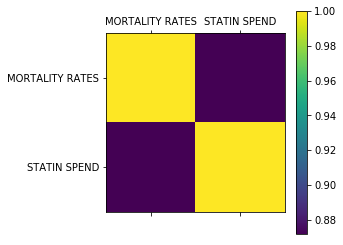

In [60]:
#correlation matrix plot

df_z1=df_m.drop(['REGION'], axis=1)

df_z=df_z1.rename(columns={'REGIONAL STATIN SPEND PER PATIENT': 'STATIN SPEND'})

plt.matshow(df_z.corr())
plt.xticks(range(len(df_z.columns)), df_z.columns)
plt.yticks(range(len(df_z.columns)), df_z.columns)
plt.colorbar()
plt.show()

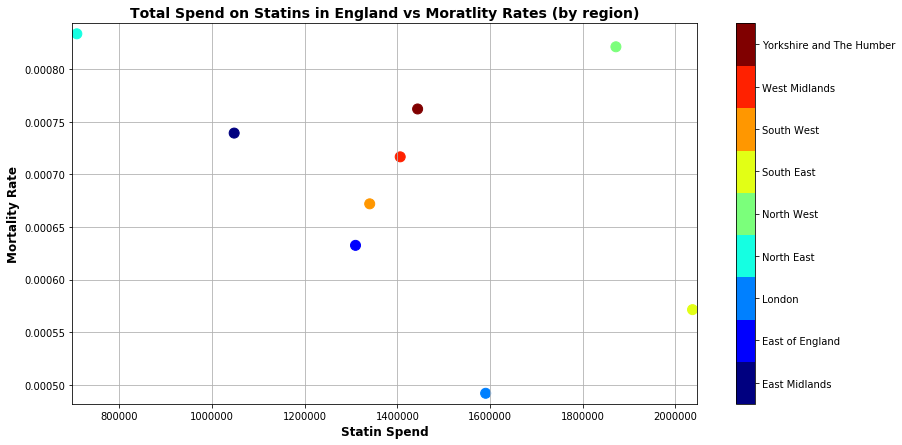

In [61]:
#######################################################
# Plot total regional spend on statins vs mortality
#######################################################

data1=df_n.values # convert dataframe into pandasnumarray

regions_list1=data1[:,0].tolist() # List of all regions
nbr_regions1 =len(regions_list1) # number of regions

label1 = list(range(0, nbr_regions1)) # list fom 0,1,2....,number of regions

x1 = data1[:,2].tolist() # Region spending on statins as list for x-axis
y1 = data1[:,1].tolist() # Mortality rate as list for y-axis


# Define a colormap with the right number of colors
cmap = plt.cm.get_cmap('jet',max(label1)-min(label1)+1)

bounds1 = range(min(label1),max(label1)+2)
norm1 = colors.BoundaryNorm(bounds, cmap.N)


plt.figure(figsize=(14, 7)) #Size of scatter plot
axes_bounds1 = [min(x1)-10000, max(x1)+10000, min(y1)-0.00001, max(y1)+0.00001] # Limits of x and y-axes

plt.scatter(x1, y1, c= label1, s=100, cmap=cmap, norm=norm) 

# Add a colorbar. Move the ticks up by 0.5, so they are centred on the colour.

cb=plt.colorbar(ticks=np.array(label1)+0.5)
cb.set_ticklabels(regions_list1)

plt.title('Total Spend on Statins in England vs Moratlity Rates (by region)', fontsize=14, fontweight='bold')
plt.xlabel("Statin Spend",fontsize=12, fontweight='bold') # Label for the x-axis
plt.ylabel("Mortality Rate",fontsize=12, fontweight='bold') # Label for the y-axis
plt.grid(True) #Show Gridlines

plt.axis(axes_bounds1) # set bounds of x and y-axes

plt.show()

# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment D </font>

# <font size="5"> <span style="color:rgb(72, 72, 72)">Read in Data: Google FluTrends Surveillance Data</font>

In [62]:
#################################################
## Read in the data files to a pandas dataframe
#################################################

# Store the url of the data as variables

url_romania = 'https://www.google.org/flutrends/about/data/flu/ro/data.txt'
url_uruguay = 'https://www.google.org/flutrends/about/data/flu/uy/data.txt'

# Create suitable column titles

col_heads_romania = ['Date', '# of cases of flu in Romania']
col_heads_uruguay = ['Date', '# of cases of flu in Uruguay']


#Set up DataFrames. Need to set header=8 to properly extract data

df_romania_FluTrends = pd.read_csv(url_romania,header=8,names=col_heads_romania, index_col=False)
df_romania_FluTrends['Date'] = pd.to_datetime(df_romania_FluTrends['Date'])

df_uruguay_FluTrends = pd.read_csv(url_uruguay,header=8,names=col_heads_uruguay, index_col=False)
df_uruguay_FluTrends['Date'] = pd.to_datetime(df_uruguay_FluTrends['Date'])

# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment D </font>

# <font size="5"><span style="color:rgb(72, 72, 72)">D (1) A visualisation of the seasonal patterns across all years</font>

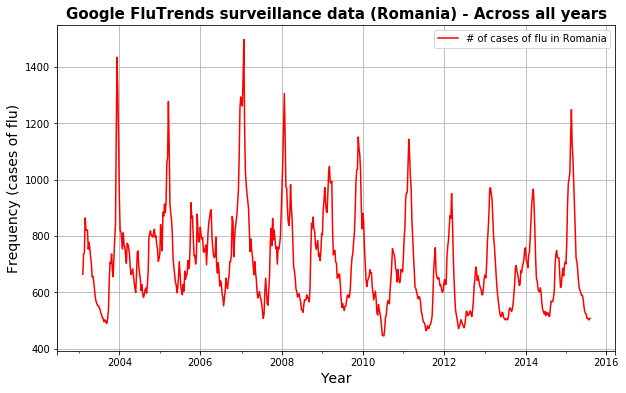

In [63]:
#######################################
## A plot of flu trends in Romania only
#######################################

romania_plot=df_romania_FluTrends.plot(legend ='left', x='Date', y = '# of cases of flu in Romania', 
                                       c='r',figsize=(10, 6), grid=True)

romania_plot.set_title('Google FluTrends surveillance data (Romania) - Across all years',fontsize=15, fontweight='bold')
romania_plot.set_ylabel('Frequency (cases of flu)',fontsize=14)
romania_plot.set_xlabel('Year',fontsize=14)
plt.show()

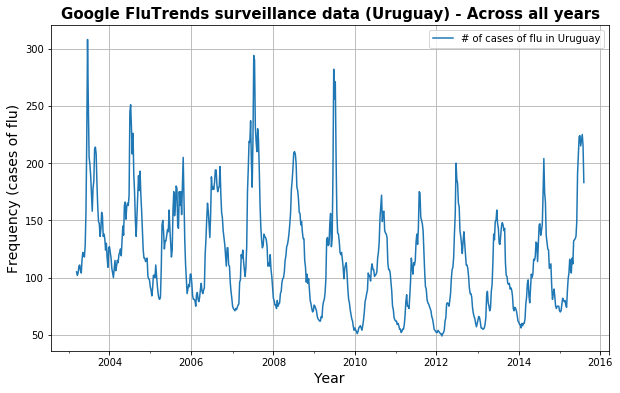

In [64]:
#######################################
## A plot of flu trends in Uruguay only
#######################################

uruguay_plot=df_uruguay_FluTrends.plot(legend ='left', x='Date', y = '# of cases of flu in Uruguay', figsize=(10, 6), grid=True)

uruguay_plot.set_title('Google FluTrends surveillance data (Uruguay) - Across all years',fontsize=15, fontweight='bold')
uruguay_plot.set_ylabel('Frequency (cases of flu)',fontsize=14)
uruguay_plot.set_xlabel('Year',fontsize=14)
plt.show()

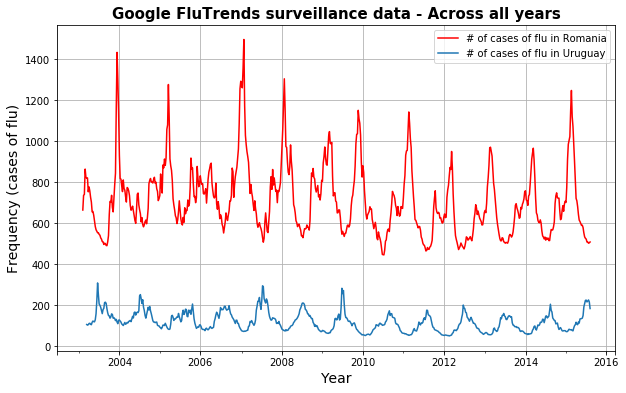

In [65]:
#####################################################
## A plot of flu trends in Romania & Uruguay together
#####################################################

#Plot and store the flu trend for Romania
ax = df_romania_FluTrends.plot(legend ='left', x='Date', y = '# of cases of flu in Romania', 
                               c='r',figsize=(10, 6), grid=True)

#Plot the flu trend for Uruguay; ax=ax plots the chart into the previous
df_uruguay_FluTrends.plot(x='Date', y = '# of cases of flu in Uruguay' , 
                          figsize=(10, 6), grid=True, ax=ax)

#Labeling of the graph

ax.set_title('Google FluTrends surveillance data - Across all years',fontsize=15, fontweight='bold')
ax.set_ylabel('Frequency (cases of flu)',fontsize=14)
ax.set_xlabel('Year',fontsize=14)
plt.show()

# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment D </font>

# <font size="5"><span style="color:rgb(72, 72, 72)">D (2) i. The yearly minimum and maximum for each country</font>

In [66]:
#################################################################
##Introduce Column that is the year taken from the column "Date" 
#################################################################

df_romania_FluTrends['year'] = pd.DatetimeIndex(df_romania_FluTrends['Date']).year
df_uruguay_FluTrends['year'] = pd.DatetimeIndex(df_uruguay_FluTrends['Date']).year

######################################
## Create lists of min and max values
######################################

romania_yearly_min=df_romania_FluTrends.groupby(['year'])['# of cases of flu in Romania'].min()
romania_yearly_max=df_romania_FluTrends.groupby(['year'])['# of cases of flu in Romania'].max()

uruguay_yearly_min=df_uruguay_FluTrends.groupby(['year'])['# of cases of flu in Uruguay'].min()
uruguay_yearly_max=df_uruguay_FluTrends.groupby(['year'])['# of cases of flu in Uruguay'].max()

######################################
## Combine lists into one DataFrame
######################################

df_Rom_Uru_min_max_temp = pd.DataFrame([uruguay_yearly_min, romania_yearly_min,
                                     uruguay_yearly_max,romania_yearly_max],
####################
## Re-name indices                                    
####################
                                    
index=['Min. annual cases of flu (Uruguay min.)', 'Min. annual cases of flu (Romania min.)', 
       'Max. annual cases of flu (Uruguay max.)', 'Max. annual cases of flu (Romania max.)'])
#######################
## Transpose & format
######################

df_Rom_Uru_min_max_temp2=pd.DataFrame(df_Rom_Uru_min_max_temp.transpose())

df_Rom_Uru_min_max = pd.DataFrame(df_Rom_Uru_min_max_temp2, dtype='float')
pd.options.display.float_format = '{:2,.0f}'.format

df_Rom_Uru_min_max

,Min. annual cases of flu (Uruguay min.),Min. annual cases of flu (Romania min.),Max. annual cases of flu (Uruguay max.),Max. annual cases of flu (Romania max.)
year,,,,
2003,102,490,308,"1,434"
2004,98,582,251,932
2005,81,591,205,"1,277"
2006,75,552,197,"1,293"
2007,71,507,294,"1,497"
2008,70,529,210,"1,305"
2009,54,535,282,"1,151"
2010,51,445,172,880
2011,52,464,175,"1,143"


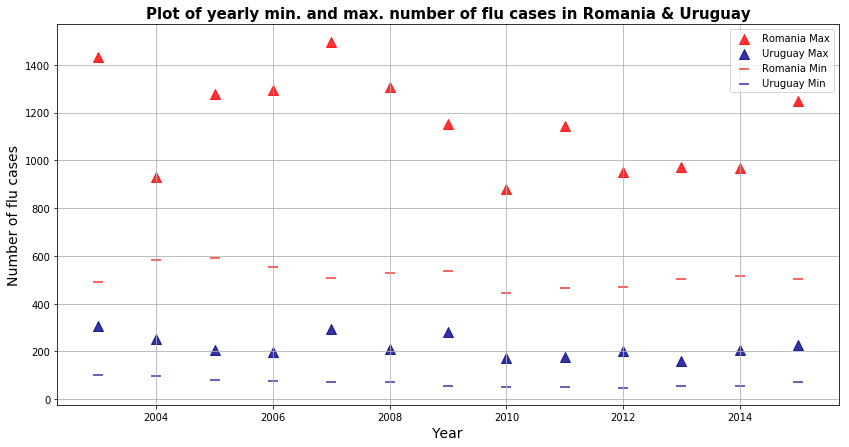

In [67]:
Rom_Uru_min_max_temp_array=df_Rom_Uru_min_max_temp.values # convert dataframe into pandasnumarray

uru_min=Rom_Uru_min_max_temp_array[0,:]
rom_min=Rom_Uru_min_max_temp_array[1,:]
uru_max=Rom_Uru_min_max_temp_array[2,:]
rom_max=Rom_Uru_min_max_temp_array[3,:]

x = np.arange(2003.0, 2016.0, 1.0) # This is the x-axis scale

#########################
## These are the y-values
#########################

y1=uru_min
y2=rom_min
y3=uru_max
y4=rom_max

s = 100 # s = Size of plot points

##############################################
## Plot for each countries' min and max values
##############################################

plt.figure(figsize=(14, 7))

plt.scatter(x,y4, s, c='red', alpha=0.8, marker='^',label="Romania Max")
plt.scatter(x,y3, s, c="darkblue", alpha=0.8, marker='^',label="Uruguay Max")
plt.scatter(x,y2, s, c="red", alpha=0.8, marker='_',label="Romania Min")
plt.scatter(x,y1, s, c="darkblue", alpha=0.8, marker='_',label="Uruguay Min")

plt.title('Plot of yearly min. and max. number of flu cases in Romania & Uruguay', 
          fontsize=15, fontweight='bold')
plt.xlabel("Year",fontsize=14) # Label the x-axis
plt.ylabel("Number of flu cases",fontsize=14)  # Label the y-axis

plt.legend(loc='best') #Location of legend ensures that legend doesn't cover the data

plt.grid(True) #Include plotlines


plt.show()

# <font size="7"> <span style="color:rgb(112, 173, 71)"> Assignment D </font>

# <font size="5"><span style="color:rgb(72, 72, 72)">D (2) ii. A mathematical function to approximate the seasonal trend of each country</font>

In [68]:
romania_date_list= [i%52 for i in range(0, len(df_romania_FluTrends['Date']))]
romania_flu_nbrs = df_romania_FluTrends['# of cases of flu in Romania'].tolist()


# Fit the data to obtain the fitted coefficients [a,b,c,d,e]
# for the quartic poly a + bx^1 + cx^2 + dx^3 + ex^4 

x_r = romania_date_list
y_r = romania_flu_nbrs
deg = 4

romania_coef = poly.polyfit(x_r, y_r, deg, rcond=None, full=False, w=None)

reverse_romania_coef = romania_coef[::-1] # need to reverse order of coeff so you can use poly1d
eqn_romania = np.poly1d(reverse_romania_coef) # This is the suitable equation

###################################
# Print a list of the coefficients
###################################

print("""On fitting the Romania FluTrends data the fitted coefficients are given by:

%s""" % romania_coef)
print("""
""")

##################################
# Print the mathematical function
#################################

print("""A suitable mathematical function that can be used as an approximation for the 
seasonal trend of flu cases in Romania is given by the quartic polynomial:""")
print("""
""")
print("""%s""" % eqn_romania)

On fitting the Romania FluTrends data the fitted coefficients are given by:

[ 8.98348980e+02 -6.57942241e-01 -2.38970454e+00  1.00497858e-01
 -1.06055332e-03]


A suitable mathematical function that can be used as an approximation for the 
seasonal trend of flu cases in Romania is given by the quartic polynomial:


           4          3        2
-0.001061 x + 0.1005 x - 2.39 x - 0.6579 x + 898.3


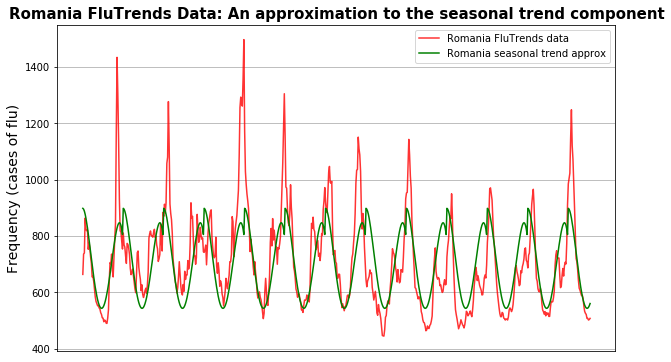

In [69]:
# Evaluate the polynomial at points x=date_list 
# using the fitted coefficients c=coefficients

c_r=romania_coef
x_r=romania_date_list

romania_curve_values = poly.polyval(x_r, c_r, tensor=True)

df_romania_curve_values=pd.DataFrame(romania_curve_values,columns=['Romania seasonal trend approx'])

df_romania_no_date=pd.DataFrame(romania_flu_nbrs,columns=['Romania FluTrends data'])

#####################################################
## A plot of flu trends in Romania & Uruguay together
#####################################################

#Plot and store the flu trend for Romania
ax = df_romania_no_date.plot(c='r', alpha=0.8, figsize=(10, 6), grid=True)

#Plot the flu trend for fitted Romania curve; ax=ax plots the chart into the previous
df_romania_curve_values.plot(c='green', figsize=(10, 6), grid=True, ax=ax)

#Labeling of the graph

ax.set_title('Romania FluTrends Data: An approximation to the seasonal trend component',fontsize=15, fontweight='bold')
ax.set_ylabel('Frequency (cases of flu)',fontsize=14)

plt.xticks([]) #Remove x-ticks for presentation only

plt.show()

In [70]:
uruguay_date_list= [i%52 for i in range(0, len(df_uruguay_FluTrends['Date']))]
uruguay_flu_nbrs = df_uruguay_FluTrends['# of cases of flu in Uruguay'].tolist()


# Fit the data to obtain the fitted coefficients [a,b,c,d,e]
# for the quartic poly a + bx^1 + cx^2 + dx^3 + ex^4 

x_r = uruguay_date_list
y_r = uruguay_flu_nbrs
deg = 4

uruguay_coef = poly.polyfit(x_r, y_r, deg, rcond=None, full=False, w=None)

reverse_uruguay_coef = uruguay_coef[::-1] # need to reverse order of coeff so you can use poly1d
eqn_uruguay = np.poly1d(reverse_uruguay_coef) # This is the suitable equation

###################################
# Print a list of the coefficients
###################################

print("""On fitting the Uruguay FluTrends data the fitted coefficients are given by:

%s""" % uruguay_coef)
print("""
""")

##################################
# Print the mathematical function
#################################

print("""A suitable mathematical function that can be used as an approximation for the 
seasonal trend of flu cases in Uruguay is given by the quartic polynomial:""")
print("""
""")
print("""%s""" % eqn_uruguay)


On fitting the Uruguay FluTrends data the fitted coefficients are given by:

[ 6.78230464e+01  6.09321302e+00  2.24730822e-01 -1.87909316e-02
  2.38878639e-04]


A suitable mathematical function that can be used as an approximation for the 
seasonal trend of flu cases in Uruguay is given by the quartic polynomial:


           4           3          2
0.0002389 x - 0.01879 x + 0.2247 x + 6.093 x + 67.82


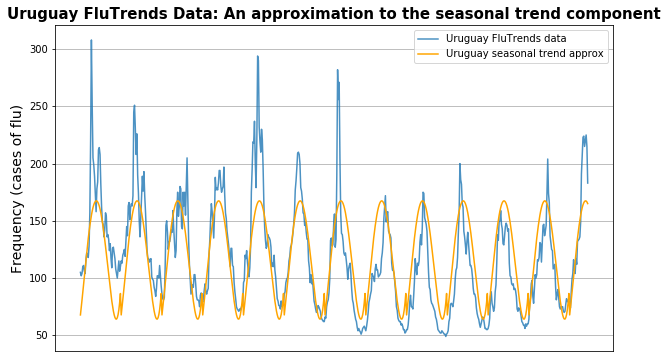

In [71]:
# Evaluate the polynomial at points x=date_list 
# using the fitted coefficients c=coefficients

c_r=uruguay_coef
x_r=uruguay_date_list

uruguay_curve_values = poly.polyval(x_r, c_r, tensor=True)

df_uruguay_curve_values=pd.DataFrame(uruguay_curve_values,columns=['Uruguay seasonal trend approx'])

df_uruguay_no_date=pd.DataFrame(uruguay_flu_nbrs,columns=['Uruguay FluTrends data'])

#####################################################
## A plot of flu trends in Uruguay & Uruguay together
#####################################################

#Plot and store the flu trend for Uruguay
ax = df_uruguay_no_date.plot(alpha=0.8, figsize=(10, 6), grid=True)

#Plot the flu trend for fitted Uruguay curve; ax=ax plots the chart into the previous
df_uruguay_curve_values.plot(c='orange', figsize=(10, 6), grid=True, ax=ax)

#Labeling of the graph

ax.set_title('Uruguay FluTrends Data: An approximation to the seasonal trend component',fontsize=15, fontweight='bold')
ax.set_ylabel('Frequency (cases of flu)',fontsize=14)

plt.xticks([]) #Remove x-ticks for presentation only

plt.show()